## Excitation exchange coupling between chromophores
This code goal is to validate the green's function solver with a working model with QuDPy. Want to see if the solver produce the good spectrum and will be use to debugging. The model is good to test the 'dense' backend optimized for smaller system. 

## Module Importation

In [1]:
from LiouvilleSpectroscopyV6 import LiouvilleSpectroscopySolver
from LiouvilleSpectroscopyV6 import SpectroscopyPlotter
import numpy as np 
import matplotlib.pyplot as plt

## Parameters definitions

There is three different library for the entire code. The first is the dictionnary of the model. The second is the dictionnary related to the solver. e.g. le choix du backend, use of cache, eta parameter for the resolvent.... 

## model definition

In [2]:
def build_coupled_dimer_model(params):
    '''
    Construct the Hamiltonian, the dipolar operators and the Lindblad operator
    for a coupled dimer system. The Hamiltonian is constructed in the site basis, and the dipolar 
    operators are constructed in the site basis as well. The Lindblad operator is constructed in the site 
    basis, and it describes the dissipation of the system due to the interaction with the environmnent.
    The function returns the Hamiltonian, the dipolar operators and the Lindblad operator. 
    '''

    hbar = params.get('hbar', 0.6582119514)
    E1 = params.get('E1', 2.0)
    E2 = params.get('E2', 2.1)
    j_coupling = params.get('j_coupling', 0.3)
    mu1 = params.get('mu1', 1.0)
    mu2 = params.get('mu2', 1.0)
    kappa = params.get('kappa', 0.1)
    T = params.get('T', 300.0)
    kB = params.get('kB', 8.617333262e-5) # Boltzmann constant in kcal/mol/K

    w1 = E1 / hbar
    w2 = E2 / hbar
    j = j_coupling / hbar

    # Construct the Hamiltonian in the site basis

    I2 = np.eye(2, dtype=complex)

    sm = np.array([[0, 1], [0, 0]], dtype=complex)
    sp = sm.conj().T

    a = np.kron(sm,I2)
    b = np.kron(I2,sm)

    a_dag = a.conj().T
    b_dag = b.conj().T

    na = a_dag @ a
    nb = b_dag @ b

    H_diag = hbar * (w1*na + w2*nb)
    H_int = hbar*j*(a_dag @ b + b_dag @ a)

    H = H_diag + H_int

    A_op = mu1*a + mu2*b
    mu_op = mu1*(a_dag + a) + mu2*(b_dag + b)

    if T > 0:
        kT = T * kB
        beta = 1.0 / kT
        n1 = 1.0 / (np.exp(E1 * beta) - 1.0)
        n2 = 1.0 / (np.exp(E2 * beta) - 1.0)
    else:
        n1, n2 = 0.0, 0.0  # Limite T=0K, pas d'excitations thermiques

    c_ops = [
        (a,     kappa * (n1 + 1.0)),
        (b,     kappa * (n2 + 1.0)),
        (a_dag, kappa * n1),
        (b_dag, kappa * n2),
    ]

    return H, A_op, mu_op, c_ops





In [3]:
params_model = {

    'E1' : 2.0,
    'E2' : 2.1,
    'j_coupling' : 0.01,
    'mu1' : 1.0,
    'mu2' : 1.0,
    'kappa' : 0.01,
    'T' : 300,
    'kB': 8.617333262e-5,
    'hbar': 0.6582119514
}

solver_params = {
    "Eta": 0.01,
    "T": params_model["T"],
    "mu": 0.0,
    "backend": "dense",
    "sparse_solver": "direct",
    "parallel_backend": "threading",
    "n_jobs": 20,
    "blas_threads": 1,
    "cache_resolvents": False,
    "cache_sparse_tau2": True,
    "sparse_gmres_rtol": 1e-6,
    "sparse_gmres_maxiter": 500,
}


J coupling value = 0.3... Kappa = 0.01...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


<Figure size 640x480 with 0 Axes>

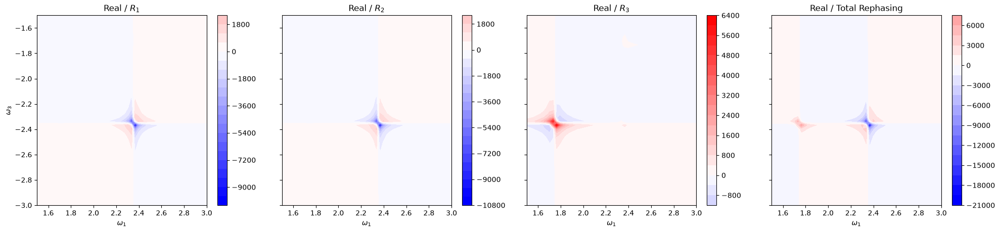

J coupling value = 0.3... Kappa = 0.05...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


<Figure size 640x480 with 0 Axes>

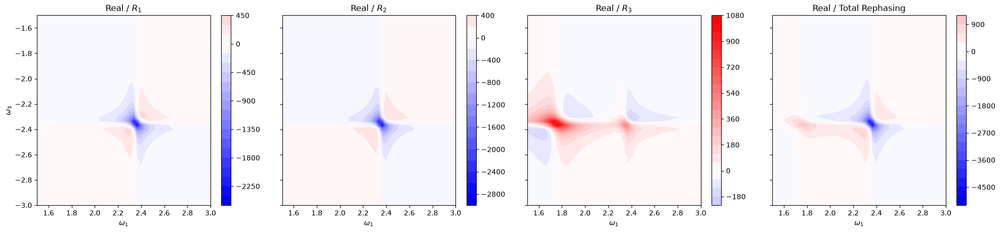

J coupling value = 0.3... Kappa = 0.1...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


<Figure size 640x480 with 0 Axes>

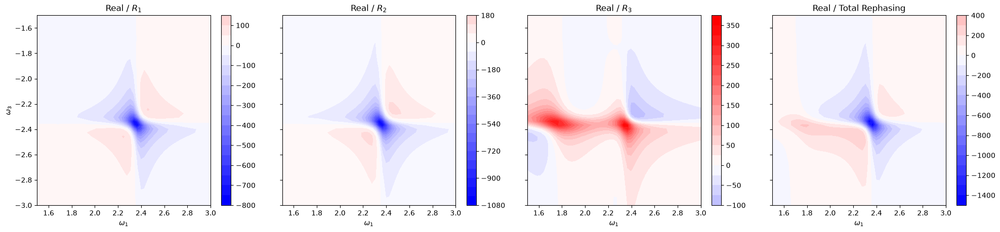

J coupling value = 0.3... Kappa = 0.15...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


<Figure size 640x480 with 0 Axes>

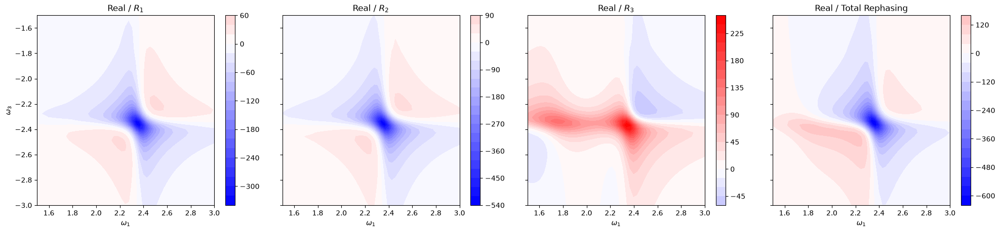

J coupling value = 0.3... Kappa = 0.2...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


<Figure size 640x480 with 0 Axes>

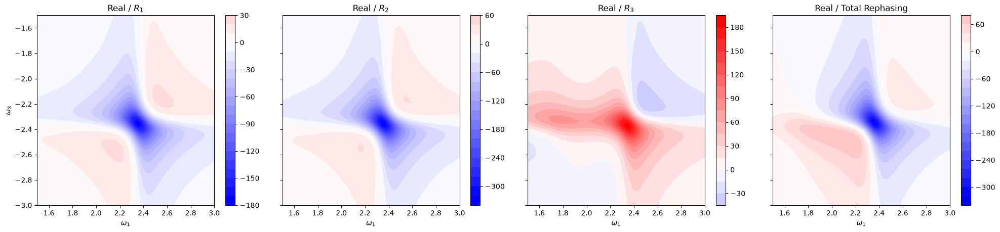

In [4]:
j_values = [0.30]
kappa_value = [0.01, 0.05, 0.10, 0.15, 0.20]
w_list = np.linspace(-3, 3, 200)

for j in j_values:
    for k in kappa_value:

        print(f"J coupling value = {j}... Kappa = {k}...")
        params_model['j_coupling'] = j
        params_model['kappa'] = k


        H, A_op, mu_op, c_ops_list = build_coupled_dimer_model(params_model)
        solver = LiouvilleSpectroscopySolver(solver_params)
        solver.feed_model(
            H_model=H,
            interaction_op_array=mu_op,
            c_ops_raw=c_ops_list,
            interaction_type="dipole",
        )


        spectra = solver.generate_2D_spectra(w_list, tau2=3.0)
        pathway_spectra = solver.generate_2D_pathways(w_list, tau2=3.0)

        plt.figure()
        plotter = SpectroscopyPlotter(w_list)

        plotter.plot_pathways_grid(
            pathways_dict=pathway_spectra, 
            signal_type="rephasing",       # Cherchera R1, R2, R3 et zoomera sur (x, -y)
            total_signal=spectra['rephasing'],
            component = 'real',
            zoom_bounds=(1.5, 3, -3, -1.5)
            
        )
        
        



J coupling value = 0.15... T2 = 5.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


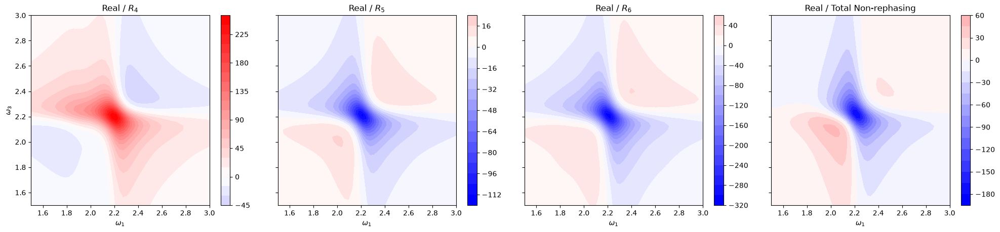

J coupling value = 0.15... T2 = 10.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


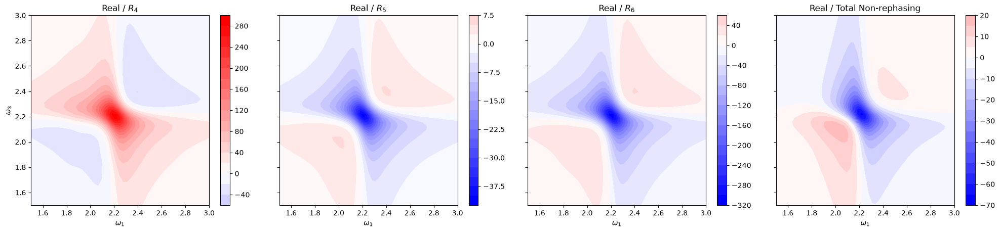

J coupling value = 0.15... T2 = 15.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


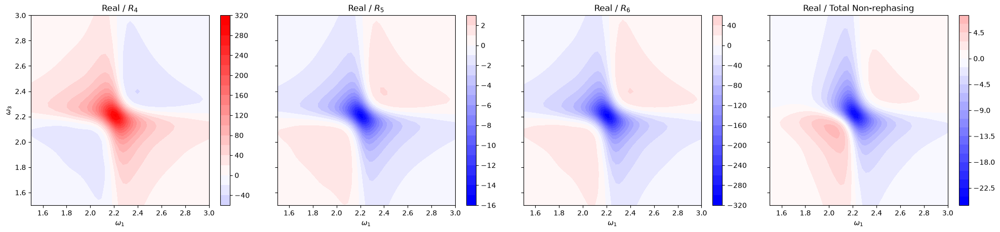

J coupling value = 0.15... T2 = 20.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


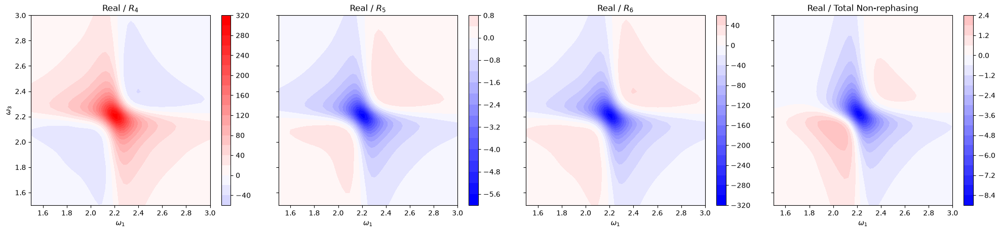

J coupling value = 0.15... T2 = 25.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


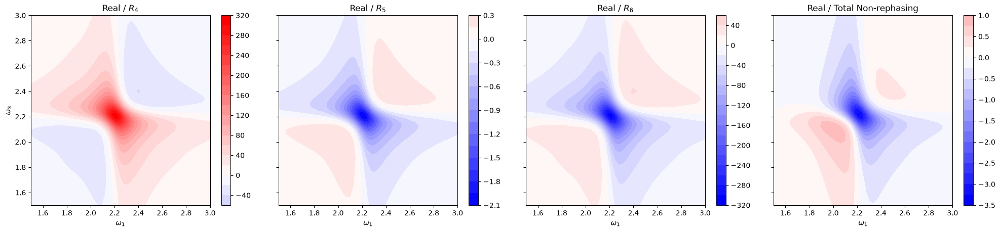

J coupling value = 0.15... T2 = 30.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


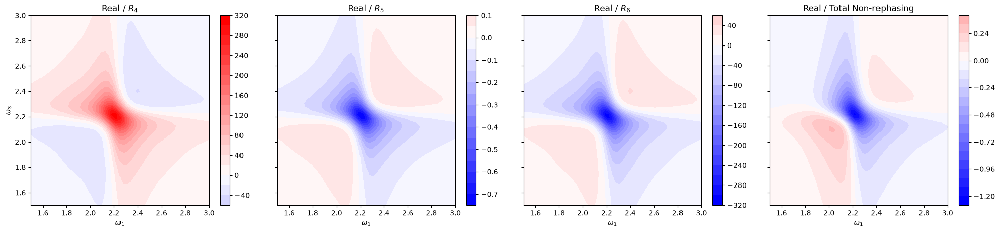

J coupling value = 0.15... T2 = 35.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


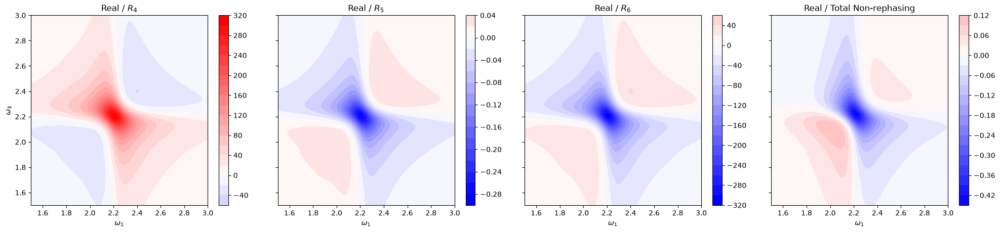

J coupling value = 0.15... T2 = 40.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


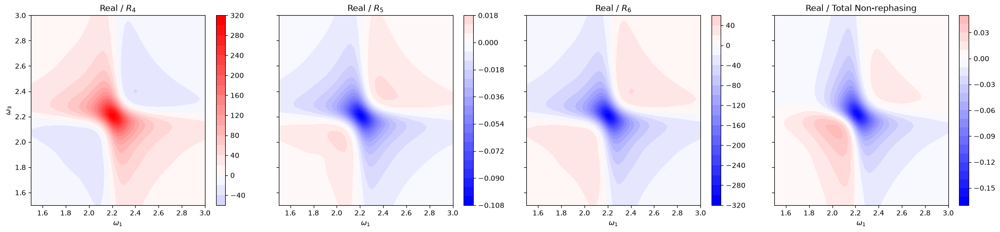

J coupling value = 0.15... T2 = 45.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


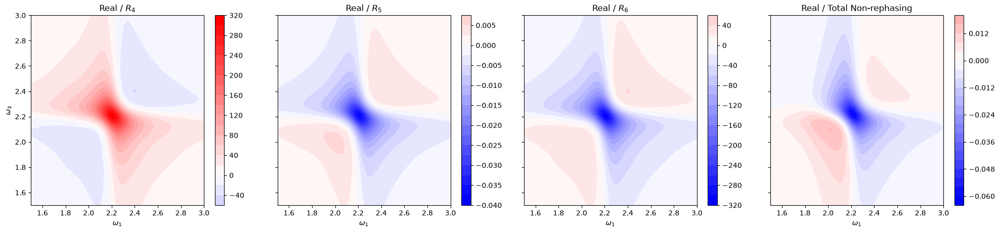

J coupling value = 0.15... T2 = 50.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


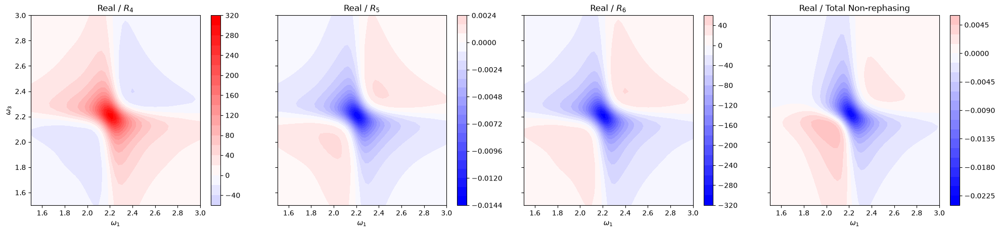

J coupling value = 0.15... T2 = 55.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


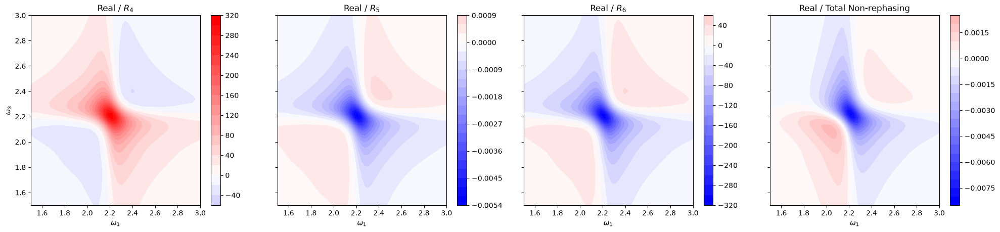

J coupling value = 0.15... T2 = 60.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


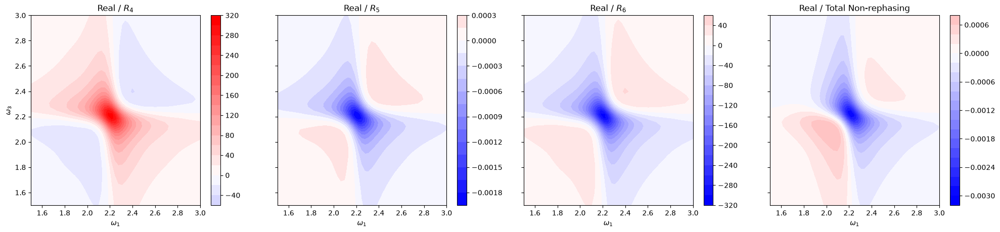

J coupling value = 0.15... T2 = 65.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


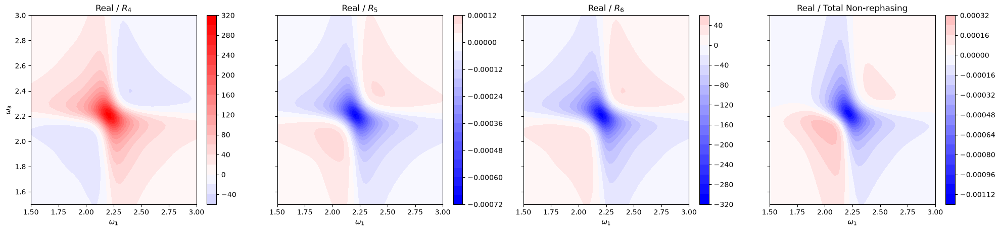

J coupling value = 0.15... T2 = 70.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


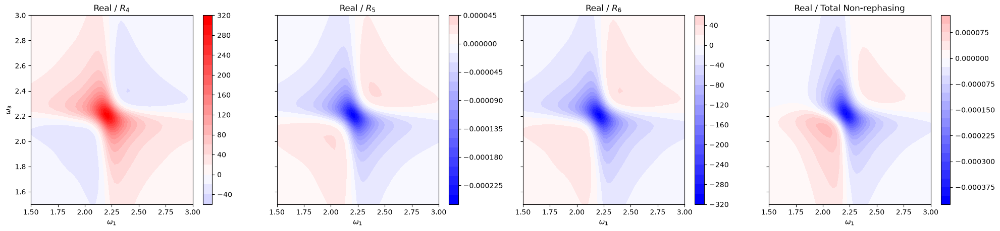

J coupling value = 0.15... T2 = 75.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


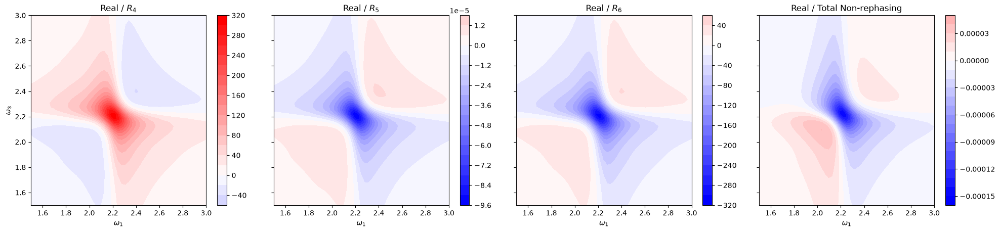

J coupling value = 0.15... T2 = 80.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


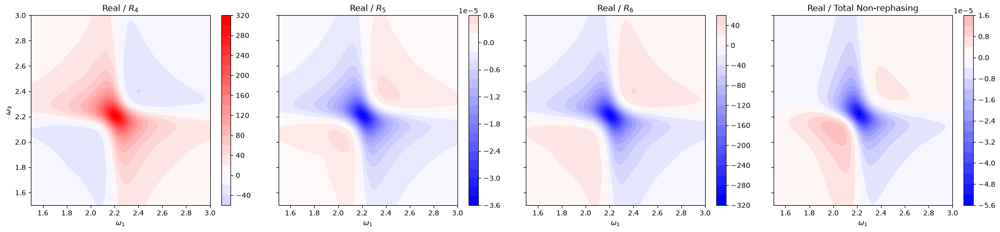

J coupling value = 0.15... T2 = 85.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


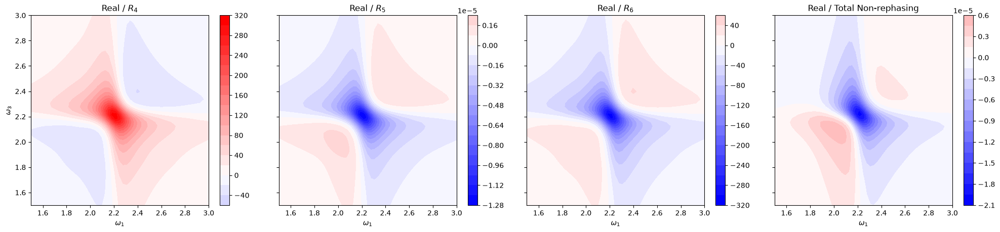

J coupling value = 0.15... T2 = 90.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


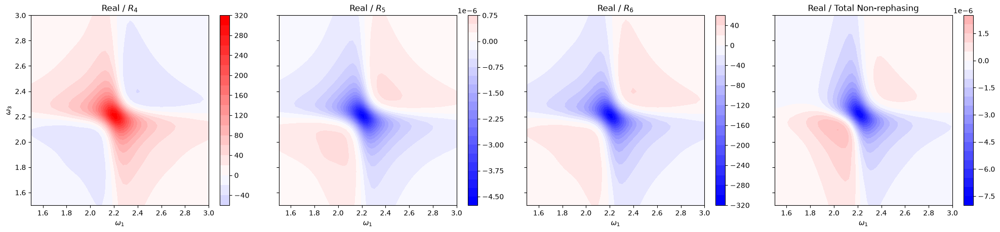

J coupling value = 0.15... T2 = 95.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


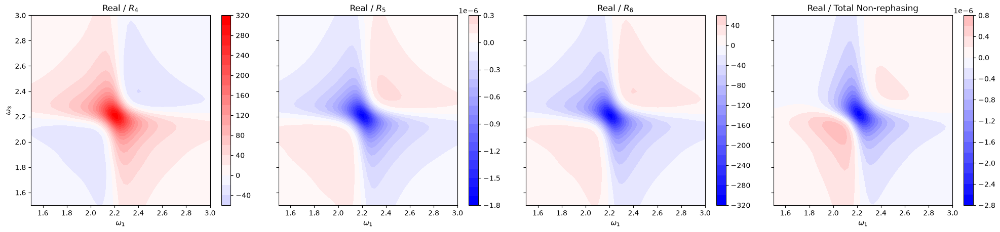

J coupling value = 0.15... T2 = 100.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


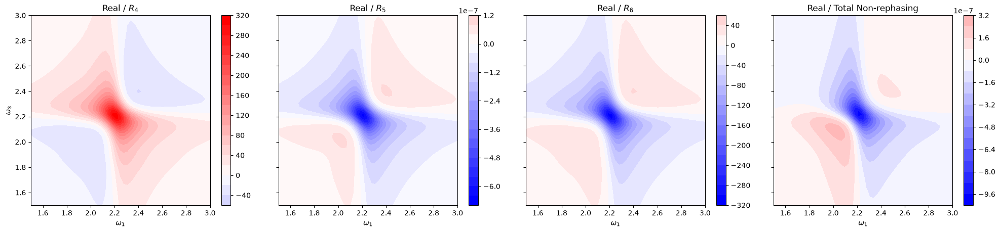

J coupling value = 0.15... T2 = 5.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


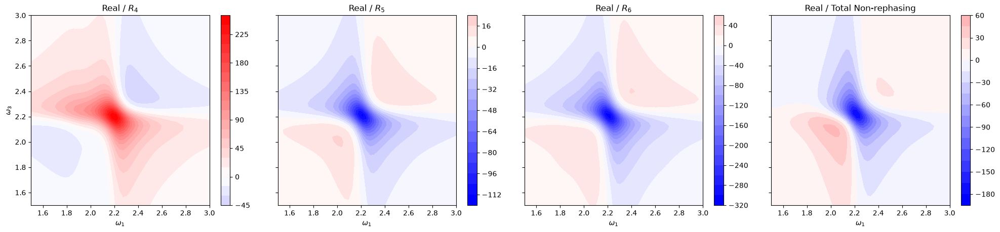

J coupling value = 0.15... T2 = 10.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


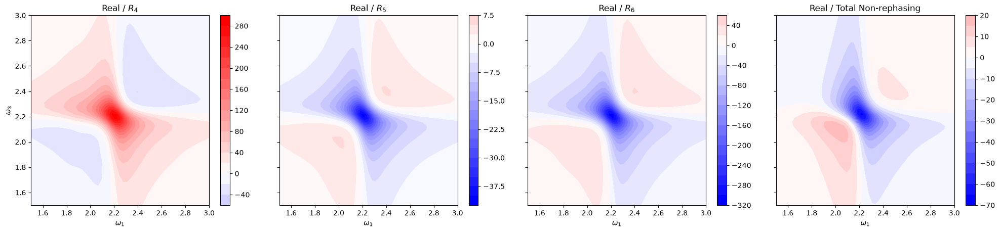

J coupling value = 0.15... T2 = 15.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


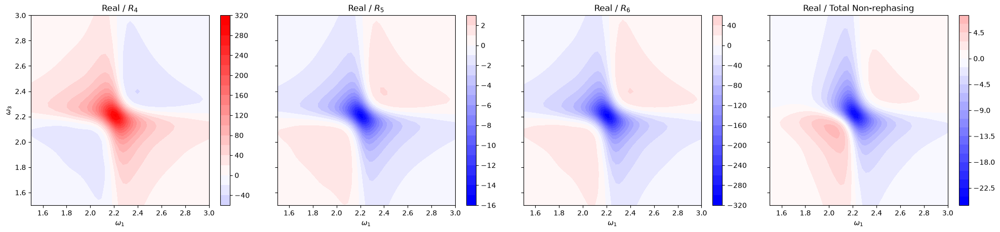

J coupling value = 0.15... T2 = 20.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


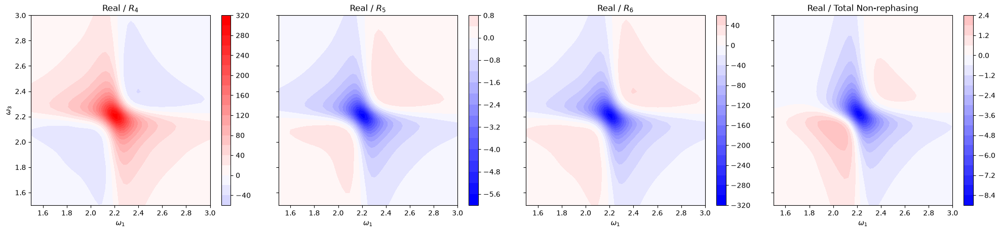

J coupling value = 0.15... T2 = 25.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


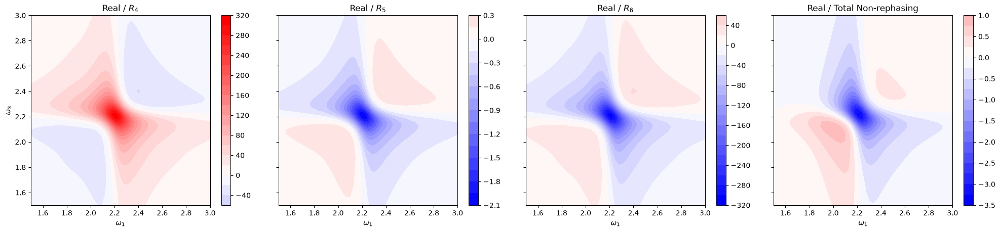

J coupling value = 0.15... T2 = 30.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


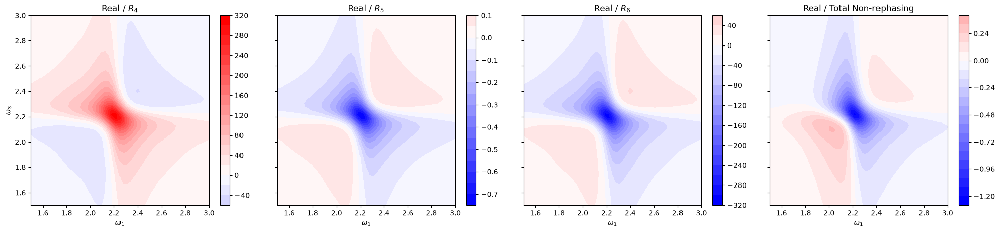

J coupling value = 0.15... T2 = 35.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


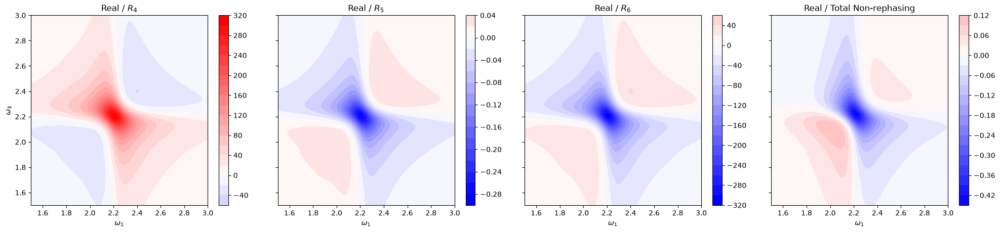

J coupling value = 0.15... T2 = 40.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


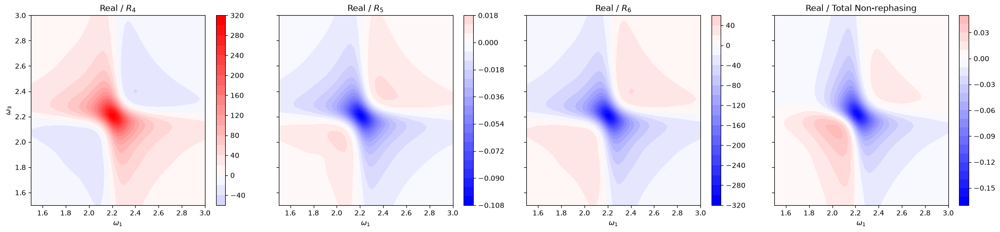

J coupling value = 0.15... T2 = 45.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


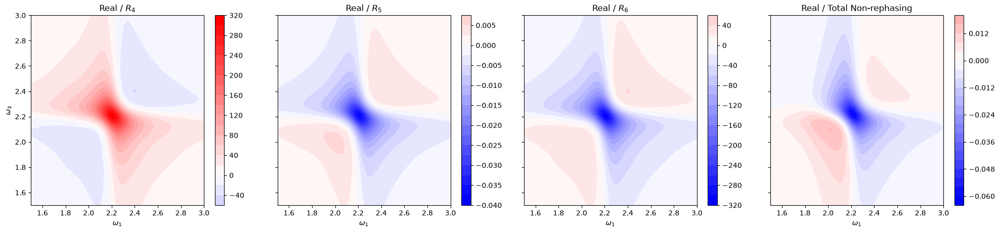

J coupling value = 0.15... T2 = 50.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


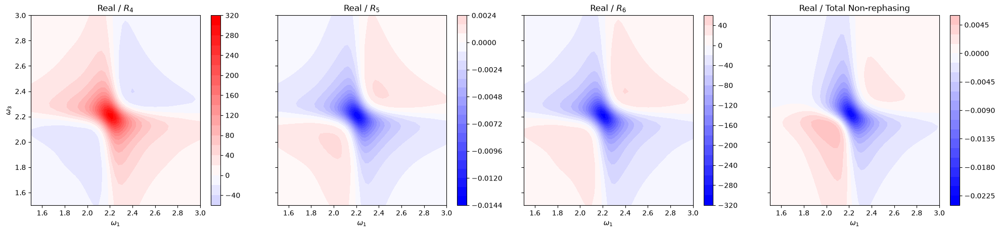

J coupling value = 0.15... T2 = 55.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


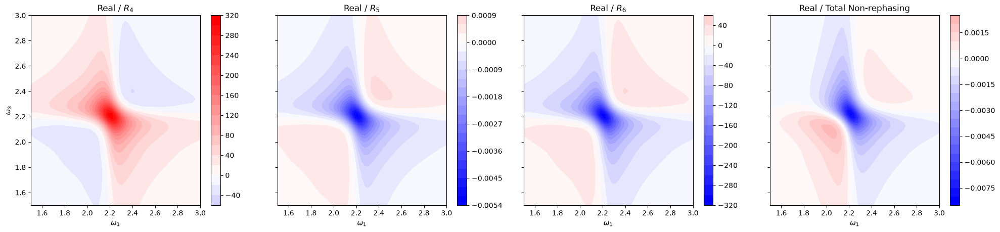

J coupling value = 0.15... T2 = 60.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


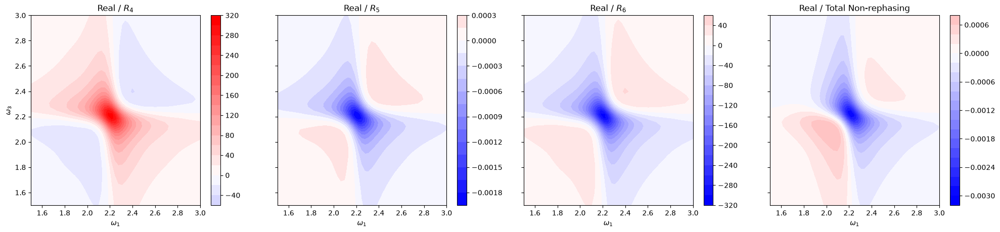

J coupling value = 0.15... T2 = 65.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


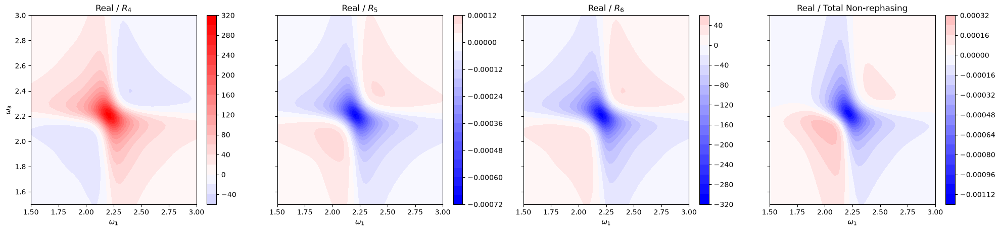

J coupling value = 0.15... T2 = 70.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


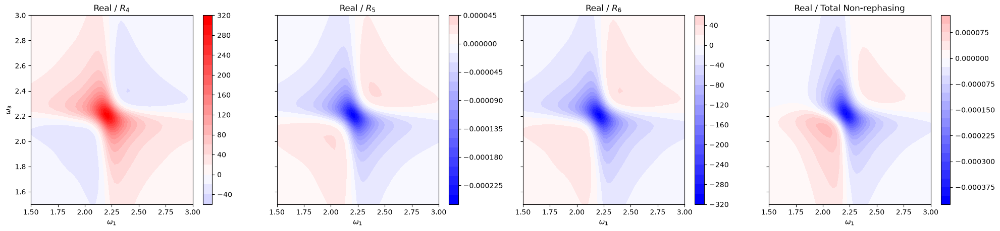

J coupling value = 0.15... T2 = 75.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


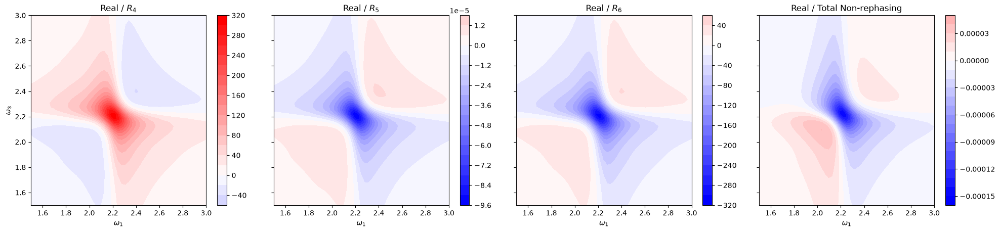

J coupling value = 0.15... T2 = 80.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


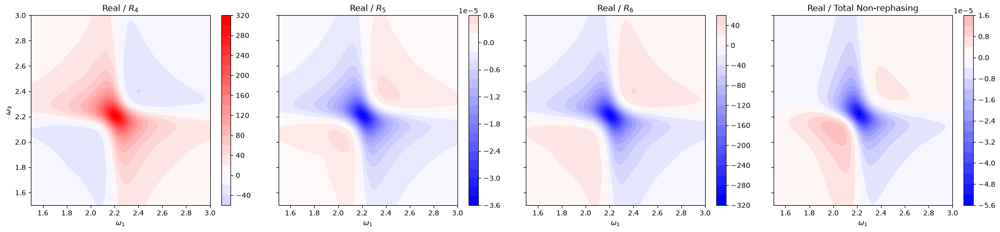

J coupling value = 0.15... T2 = 85.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


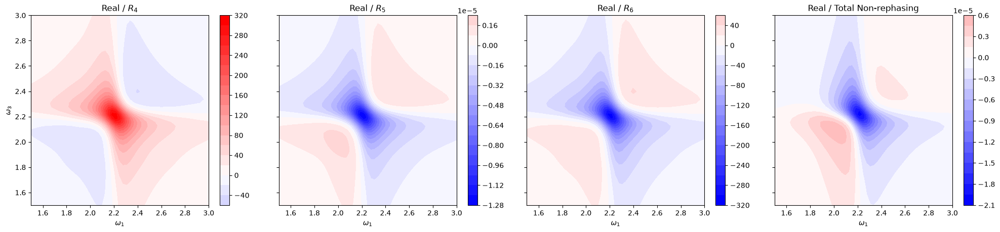

J coupling value = 0.15... T2 = 90.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


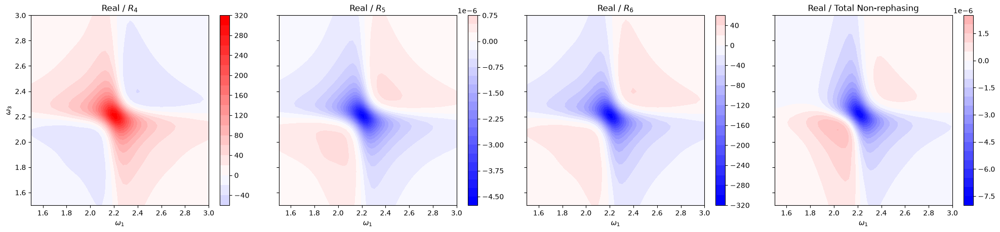

J coupling value = 0.15... T2 = 95.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


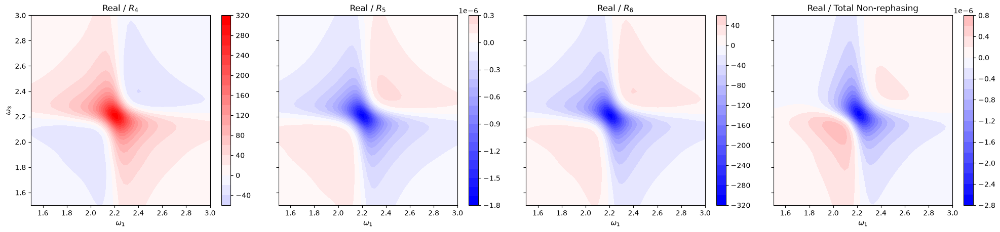

J coupling value = 0.15... T2 = 100.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


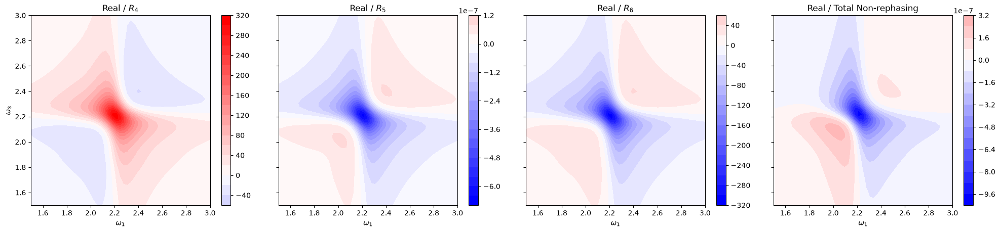

J coupling value = 0.15... T2 = 5.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


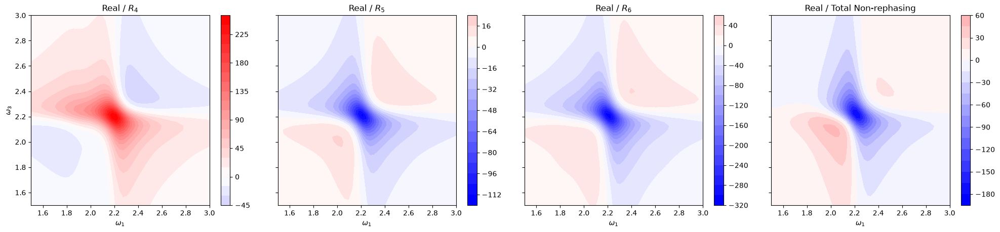

J coupling value = 0.15... T2 = 10.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


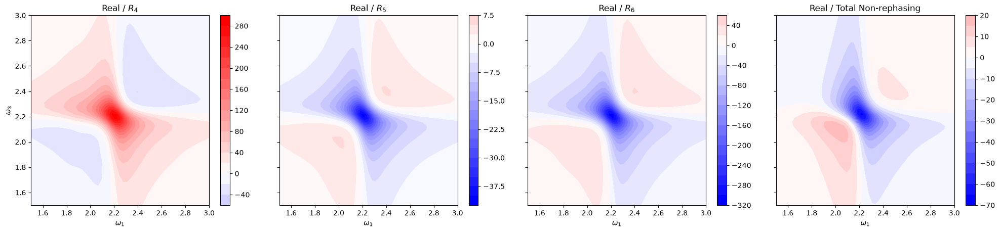

J coupling value = 0.15... T2 = 15.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


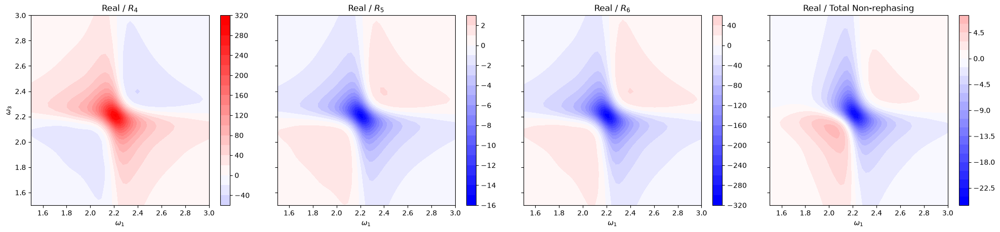

J coupling value = 0.15... T2 = 20.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


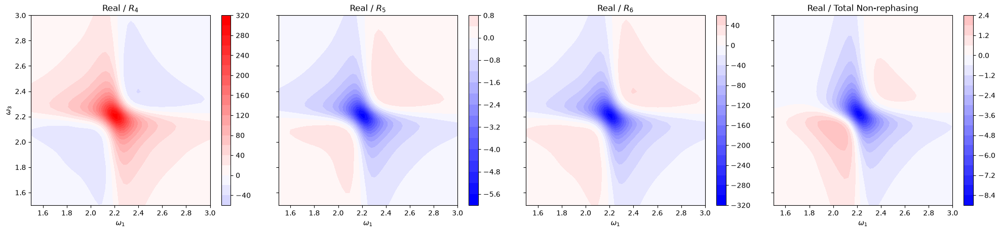

J coupling value = 0.15... T2 = 25.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


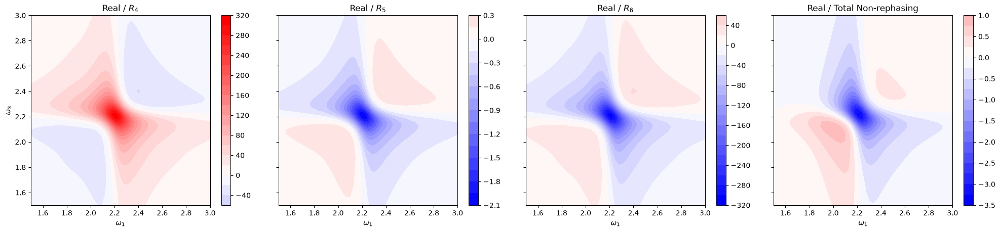

J coupling value = 0.15... T2 = 30.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


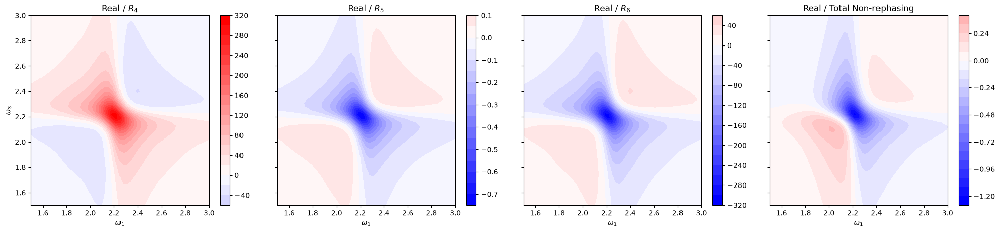

J coupling value = 0.15... T2 = 35.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


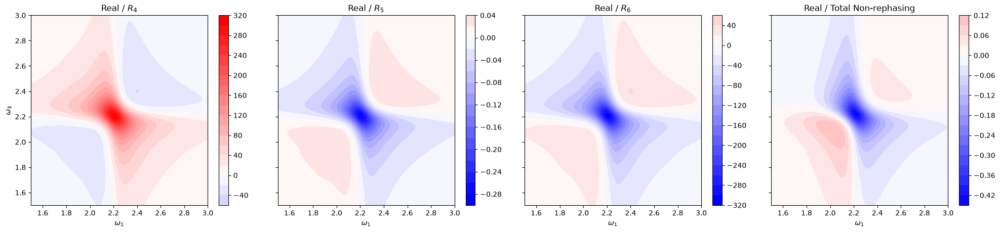

J coupling value = 0.15... T2 = 40.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


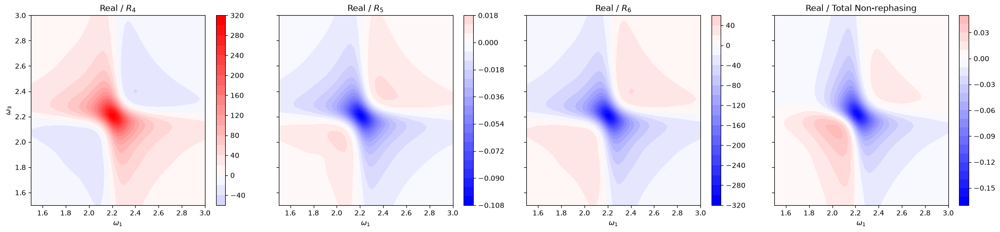

J coupling value = 0.15... T2 = 45.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


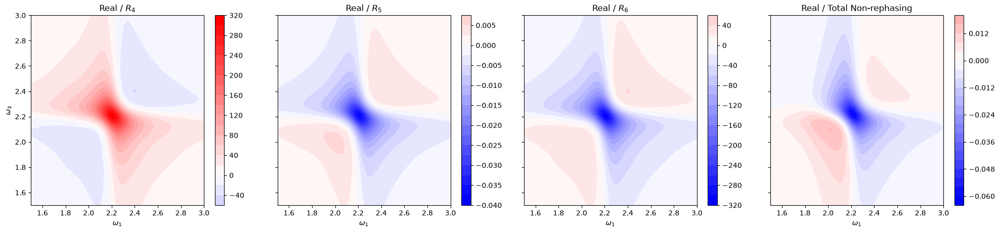

J coupling value = 0.15... T2 = 50.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


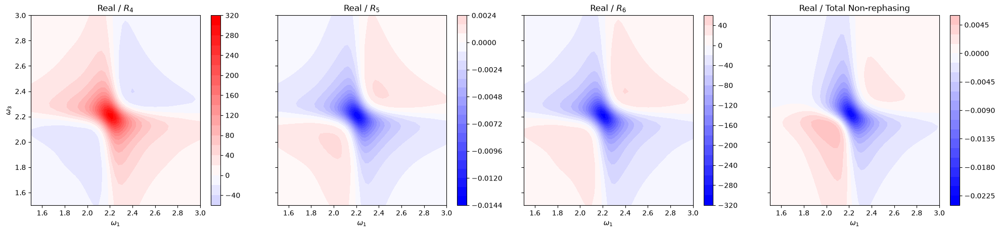

J coupling value = 0.15... T2 = 55.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


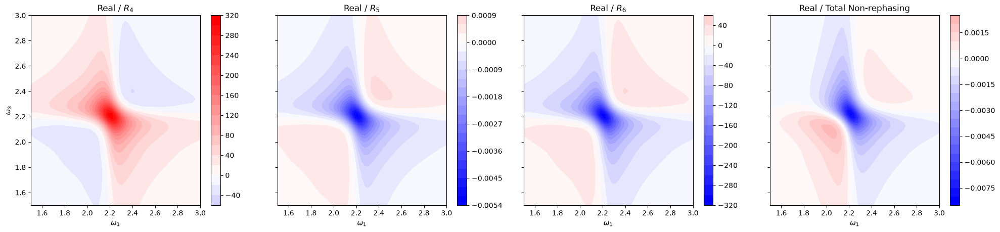

J coupling value = 0.15... T2 = 60.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


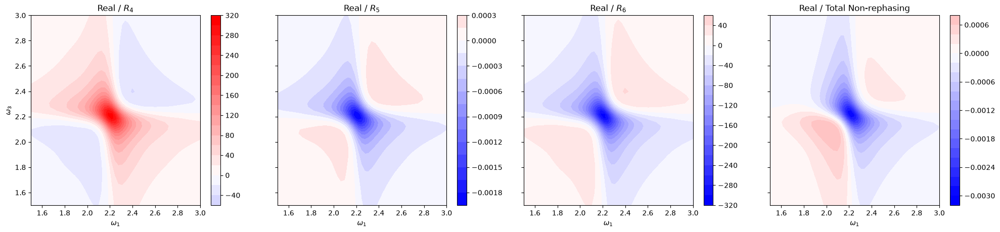

J coupling value = 0.15... T2 = 65.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


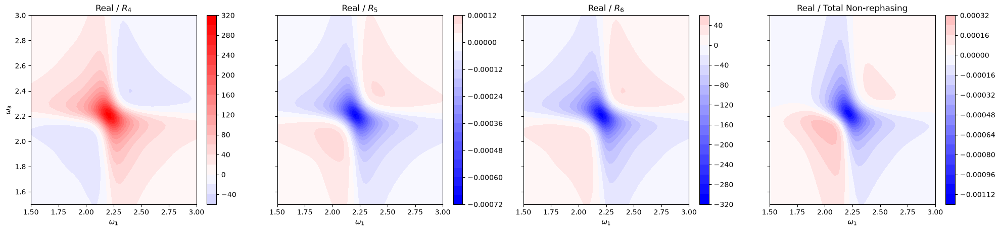

J coupling value = 0.15... T2 = 70.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


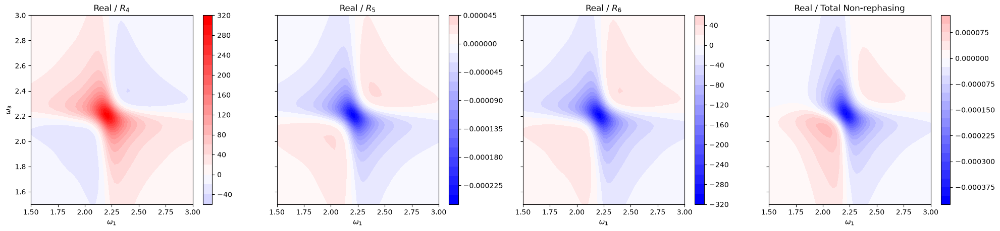

J coupling value = 0.15... T2 = 75.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


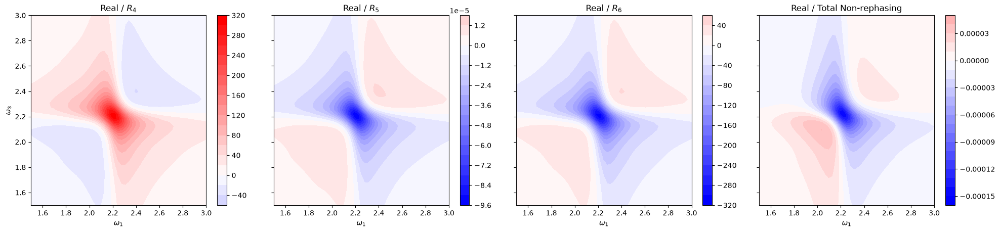

J coupling value = 0.15... T2 = 80.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


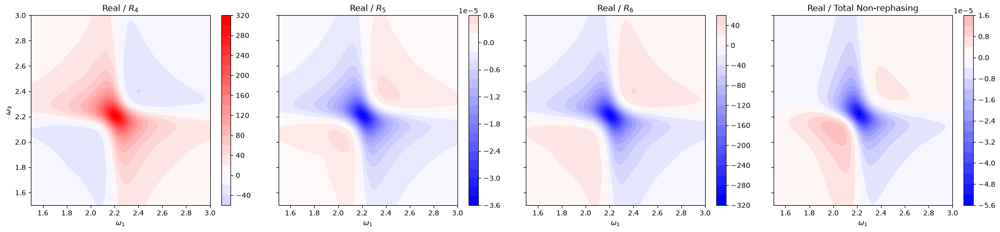

J coupling value = 0.15... T2 = 85.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


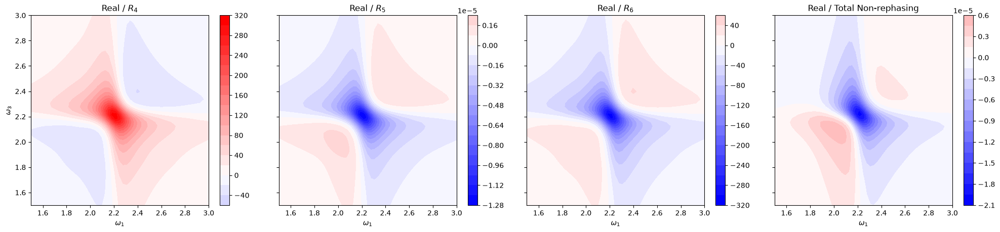

J coupling value = 0.15... T2 = 90.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


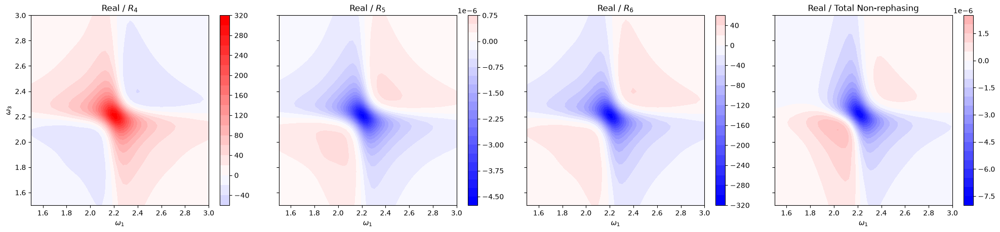

J coupling value = 0.15... T2 = 95.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


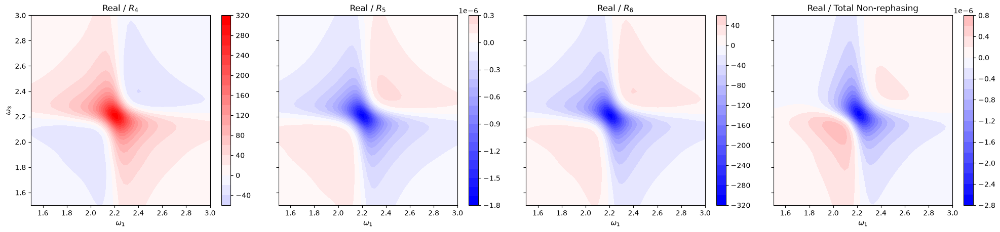

J coupling value = 0.15... T2 = 100.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


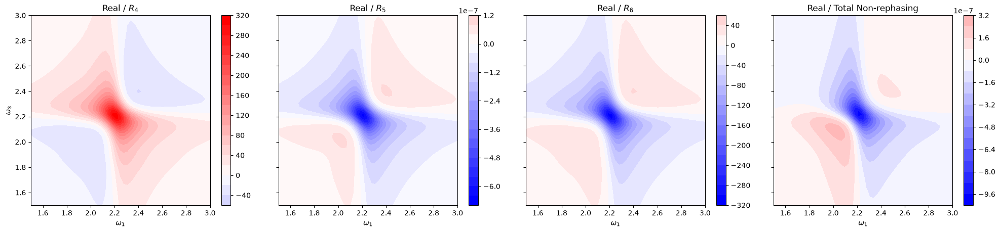

J coupling value = 0.15... T2 = 5.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


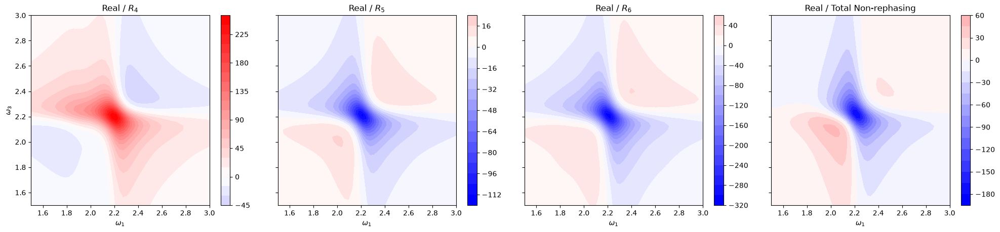

J coupling value = 0.15... T2 = 10.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


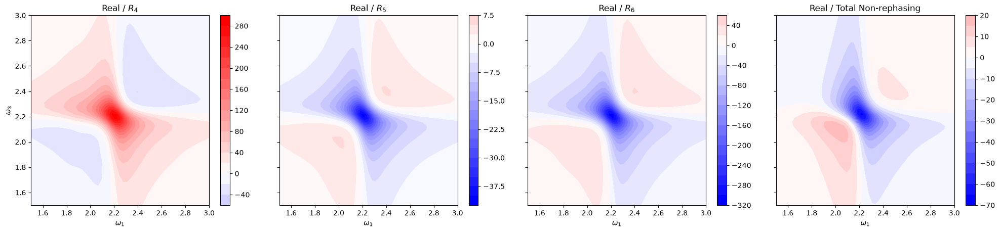

J coupling value = 0.15... T2 = 15.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


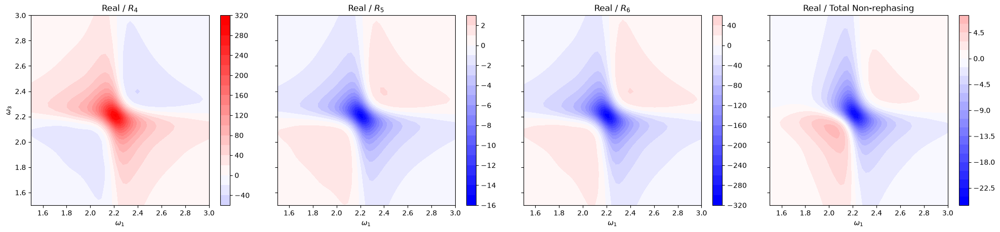

J coupling value = 0.15... T2 = 20.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


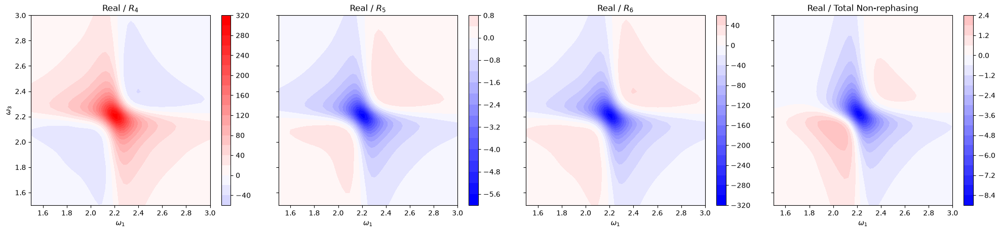

J coupling value = 0.15... T2 = 25.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


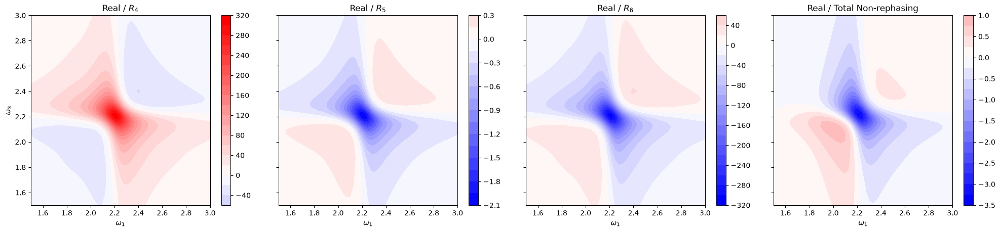

J coupling value = 0.15... T2 = 30.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


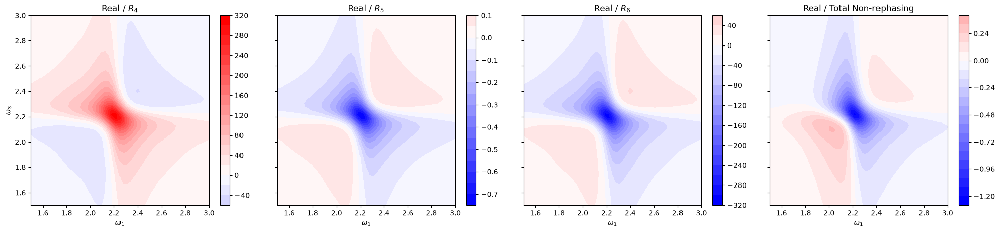

J coupling value = 0.15... T2 = 35.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


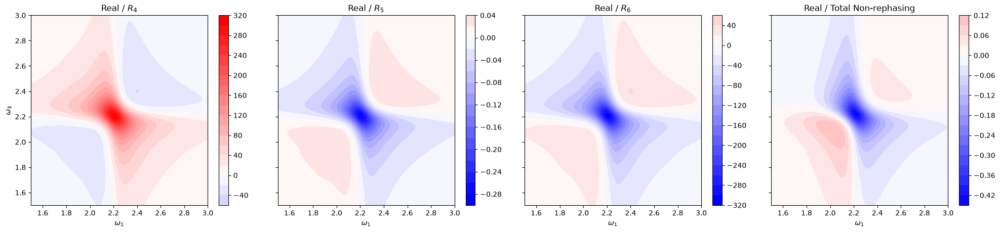

J coupling value = 0.15... T2 = 40.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


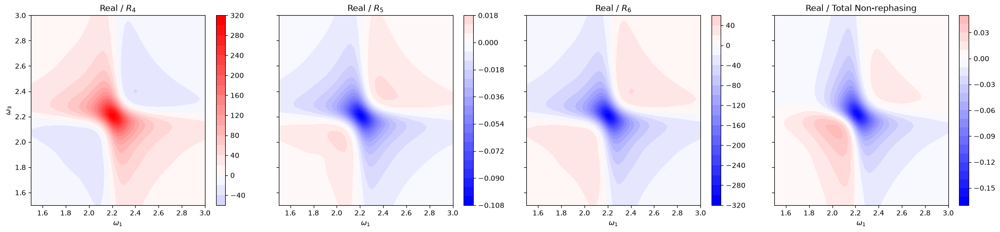

J coupling value = 0.15... T2 = 45.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


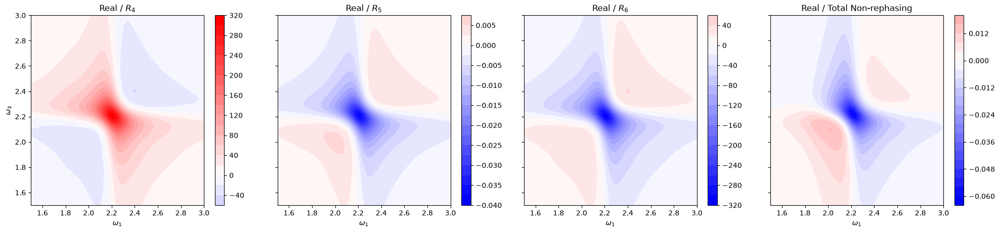

J coupling value = 0.15... T2 = 50.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


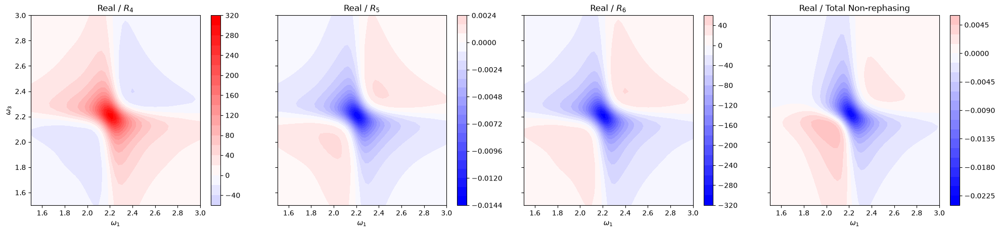

J coupling value = 0.15... T2 = 55.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


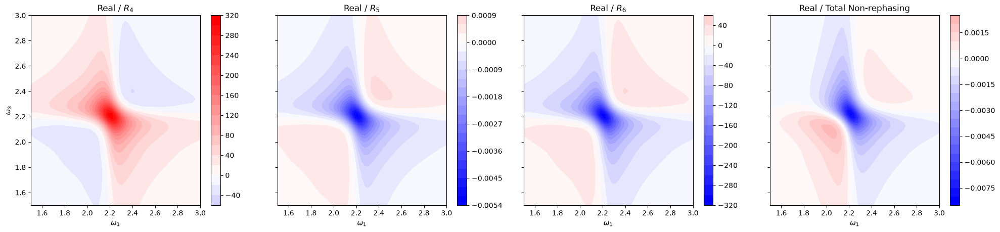

J coupling value = 0.15... T2 = 60.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


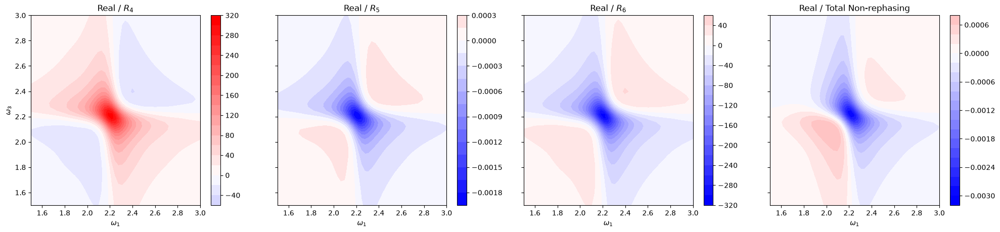

J coupling value = 0.15... T2 = 65.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


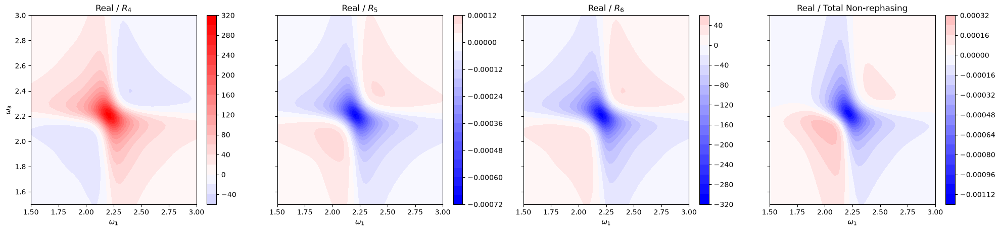

J coupling value = 0.15... T2 = 70.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


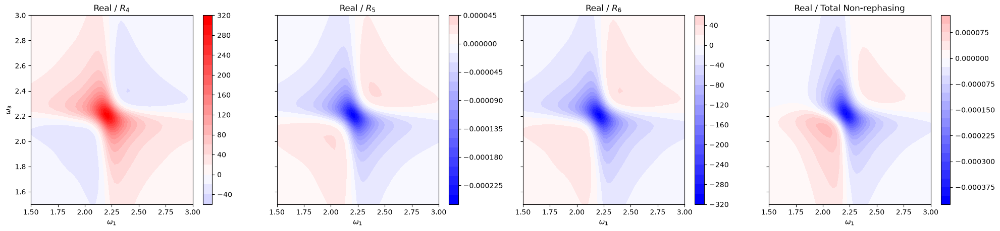

J coupling value = 0.15... T2 = 75.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


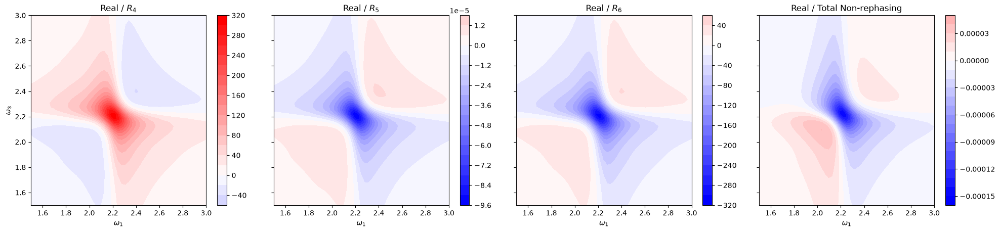

J coupling value = 0.15... T2 = 80.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


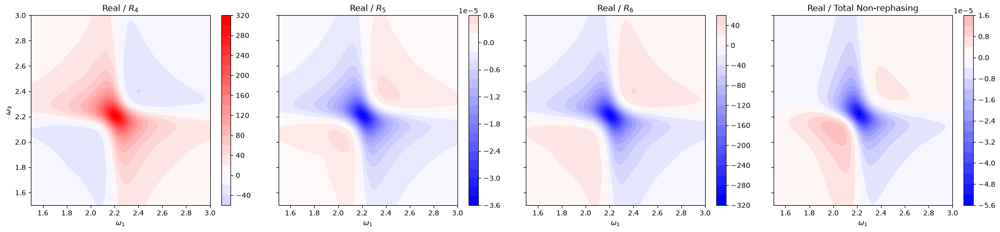

J coupling value = 0.15... T2 = 85.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


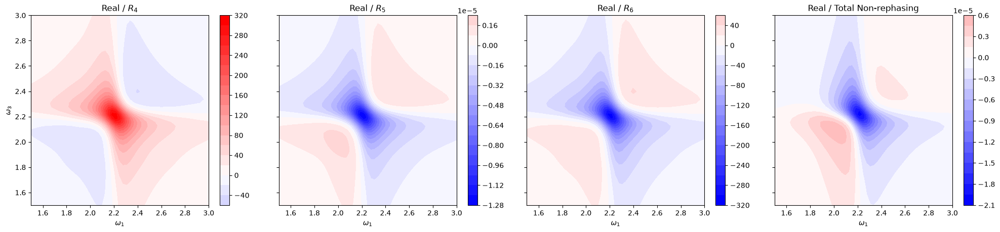

J coupling value = 0.15... T2 = 90.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


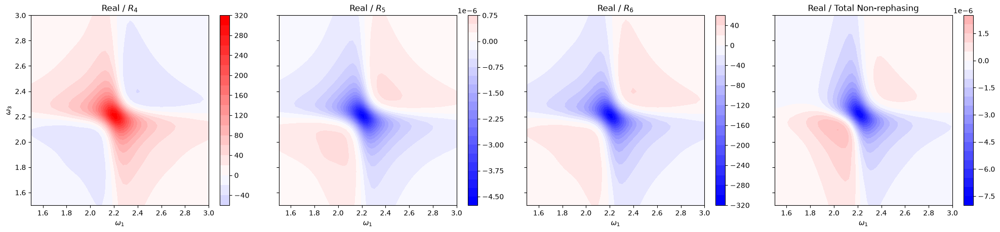

J coupling value = 0.15... T2 = 95.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


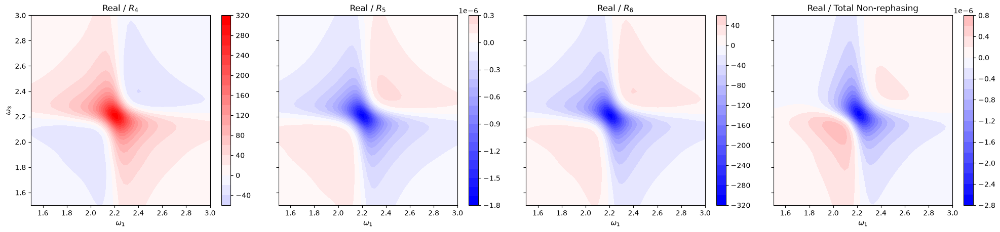

J coupling value = 0.15... T2 = 100.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


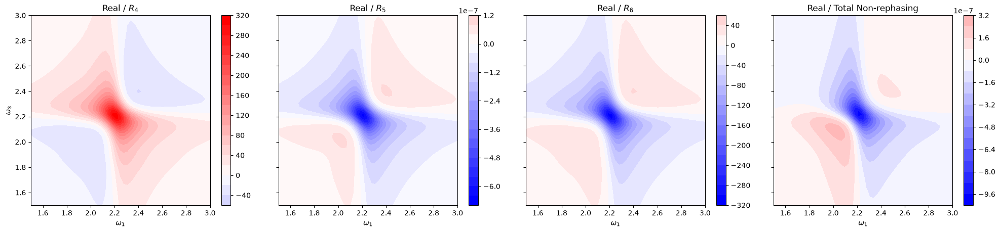

J coupling value = 0.15... T2 = 5.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


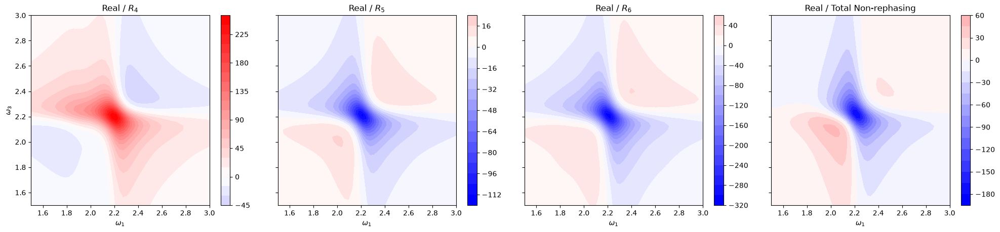

J coupling value = 0.15... T2 = 10.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


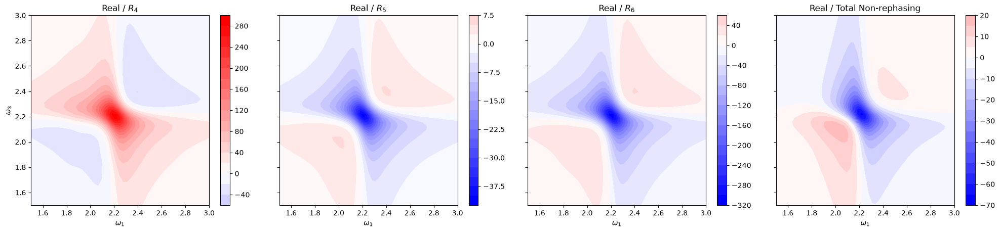

J coupling value = 0.15... T2 = 15.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


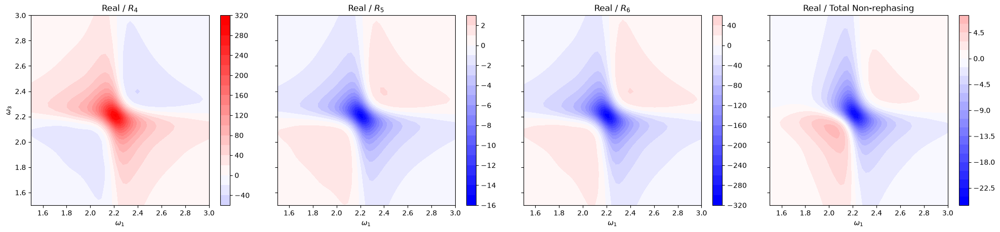

J coupling value = 0.15... T2 = 20.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


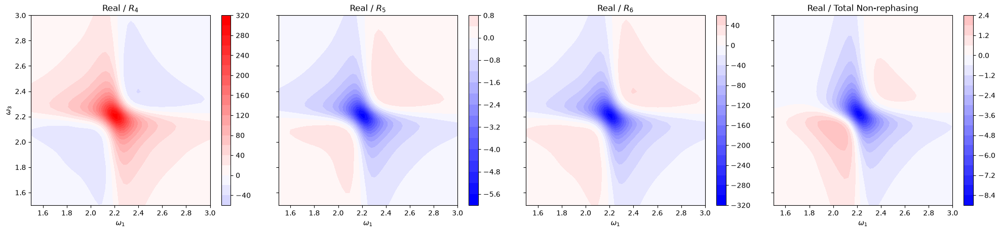

J coupling value = 0.15... T2 = 25.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


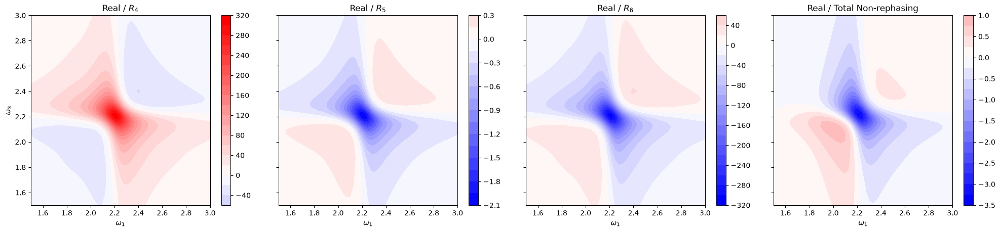

J coupling value = 0.15... T2 = 30.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


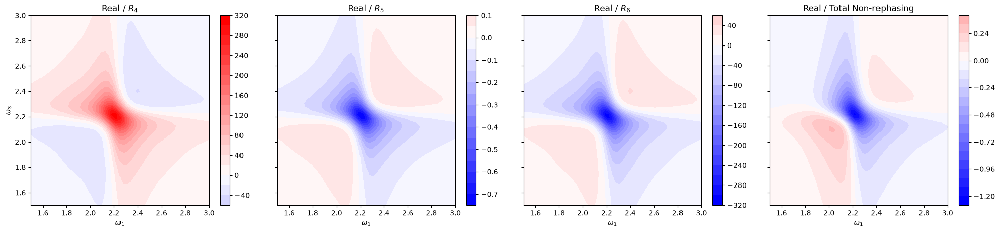

J coupling value = 0.15... T2 = 35.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


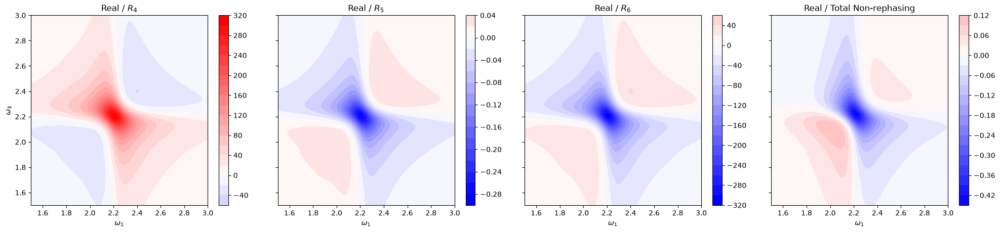

J coupling value = 0.15... T2 = 40.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


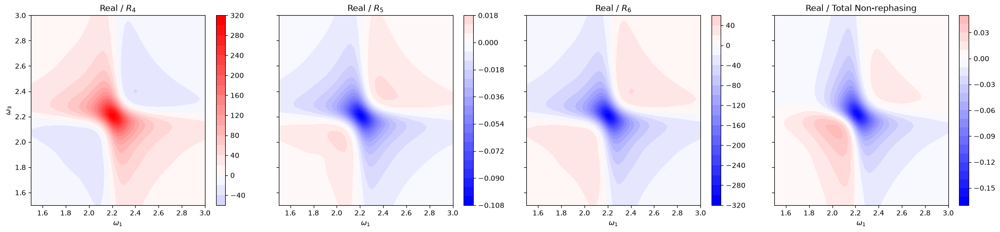

J coupling value = 0.15... T2 = 45.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


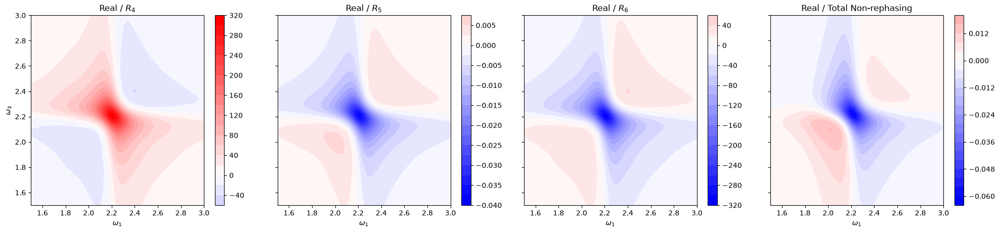

J coupling value = 0.15... T2 = 50.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


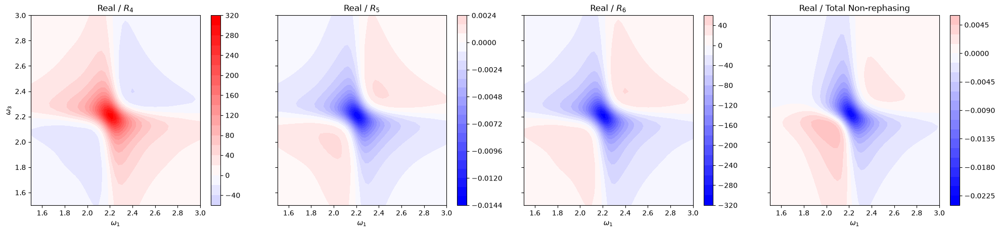

J coupling value = 0.15... T2 = 55.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


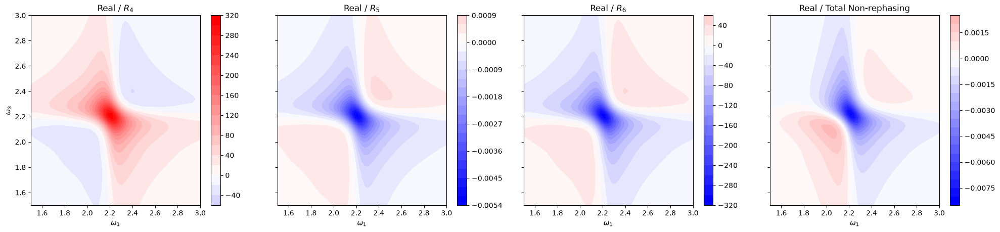

J coupling value = 0.15... T2 = 60.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


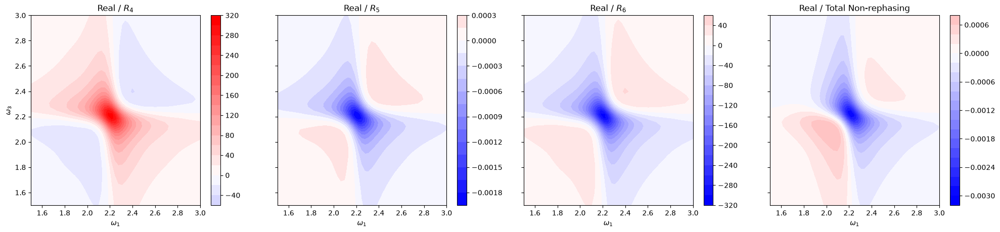

J coupling value = 0.15... T2 = 65.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


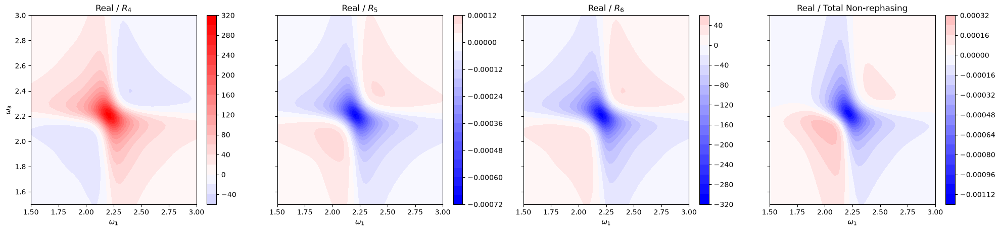

J coupling value = 0.15... T2 = 70.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


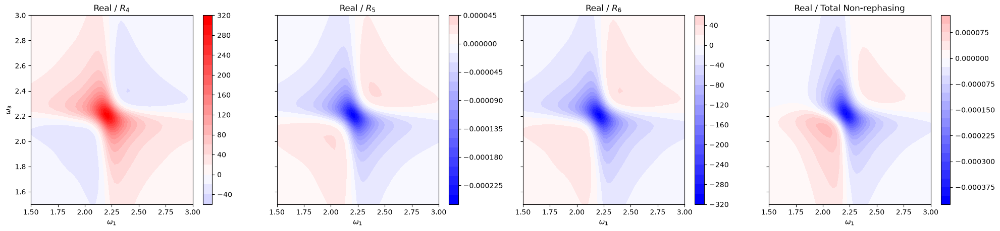

J coupling value = 0.15... T2 = 75.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


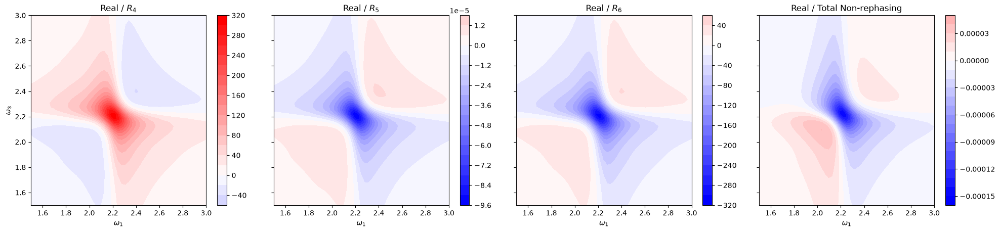

J coupling value = 0.15... T2 = 80.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


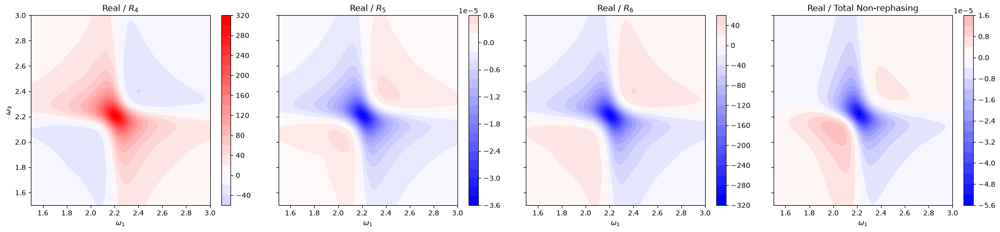

J coupling value = 0.15... T2 = 85.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


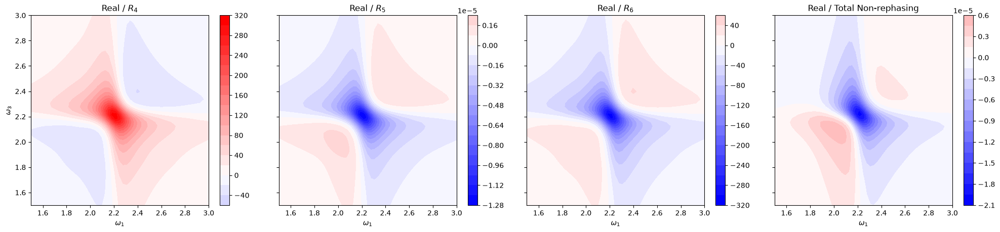

J coupling value = 0.15... T2 = 90.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


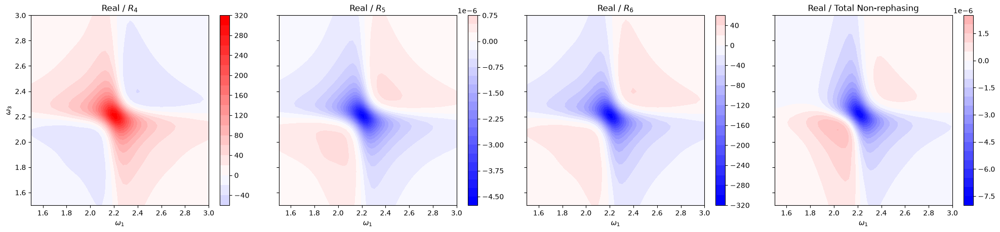

J coupling value = 0.15... T2 = 95.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


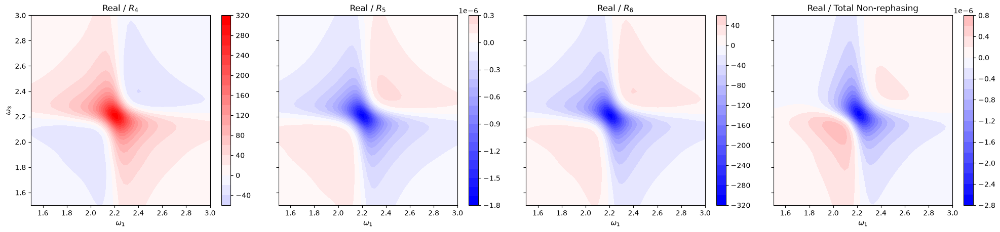

J coupling value = 0.15... T2 = 100.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


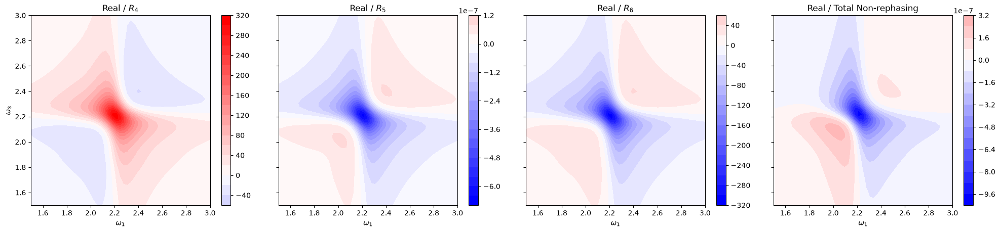

J coupling value = 0.15... T2 = 5.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


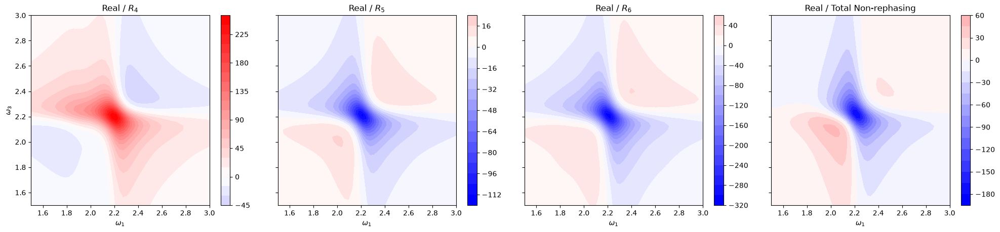

J coupling value = 0.15... T2 = 10.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


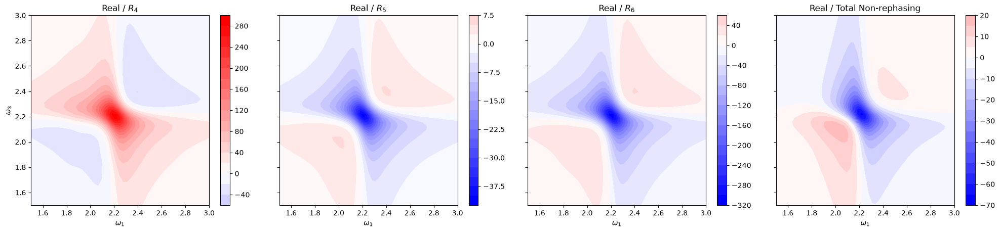

J coupling value = 0.15... T2 = 15.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


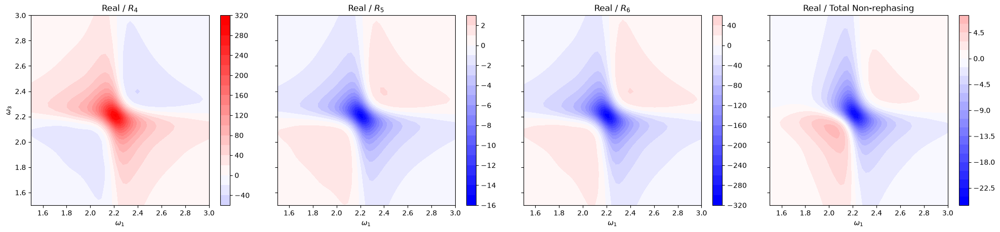

J coupling value = 0.15... T2 = 20.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


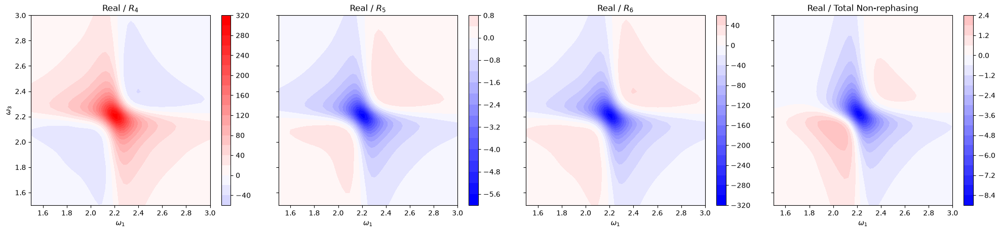

J coupling value = 0.15... T2 = 25.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


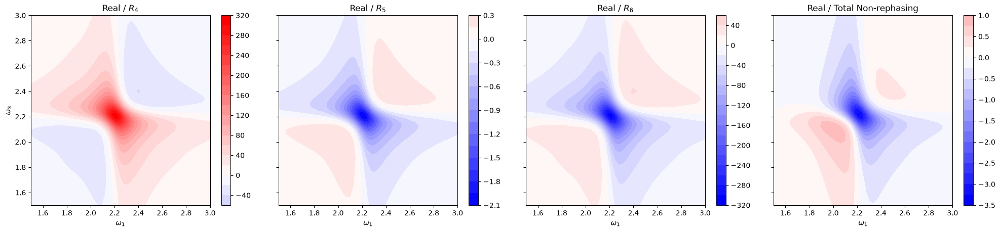

J coupling value = 0.15... T2 = 30.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


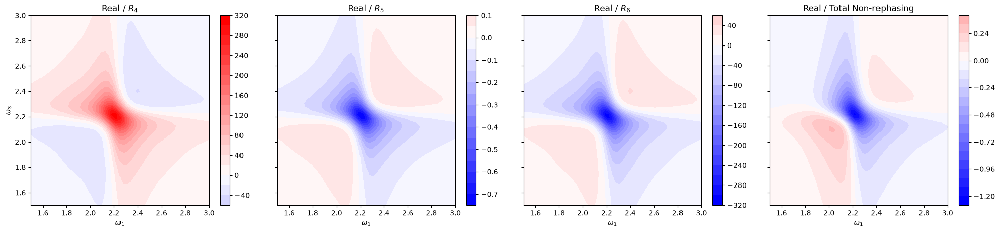

J coupling value = 0.15... T2 = 35.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


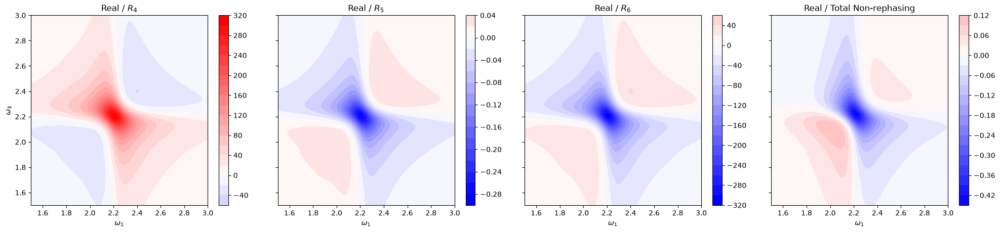

J coupling value = 0.15... T2 = 40.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


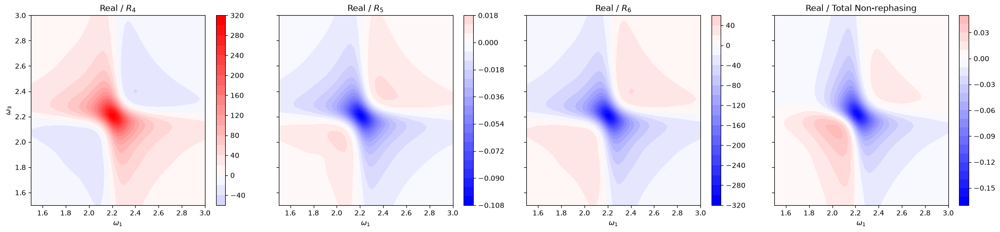

J coupling value = 0.15... T2 = 45.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


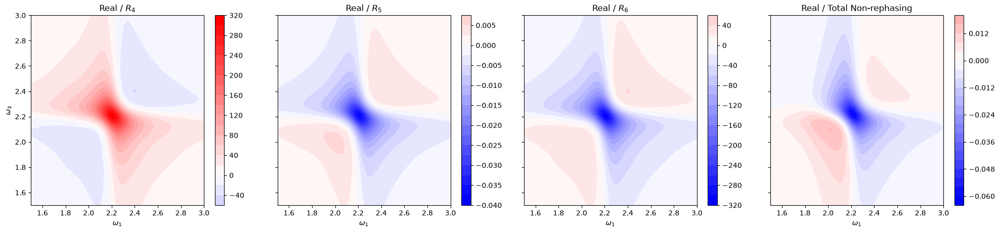

J coupling value = 0.15... T2 = 50.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


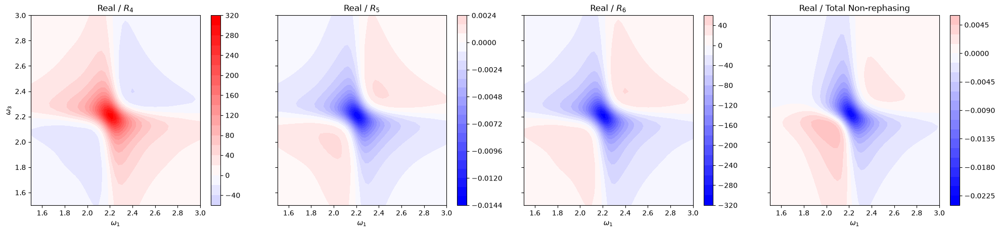

J coupling value = 0.15... T2 = 55.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


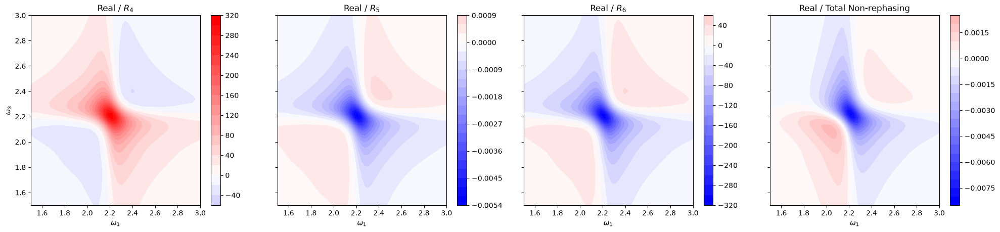

J coupling value = 0.15... T2 = 60.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


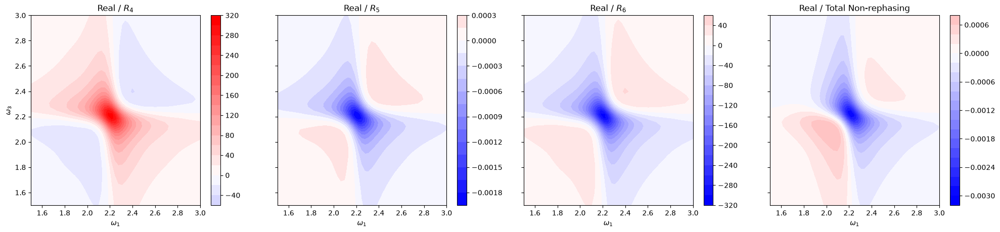

J coupling value = 0.15... T2 = 65.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


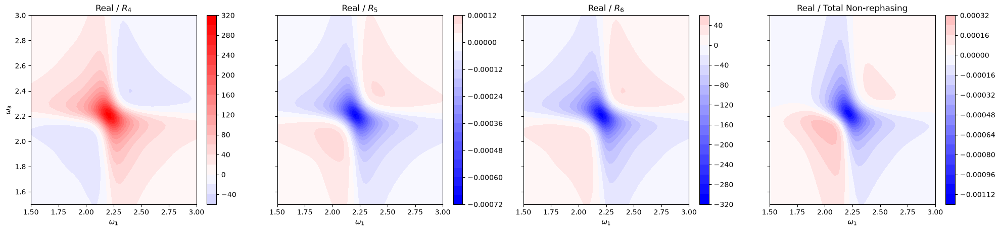

J coupling value = 0.15... T2 = 70.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


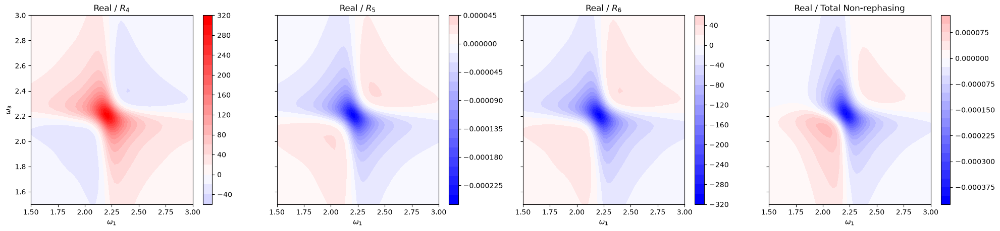

J coupling value = 0.15... T2 = 75.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


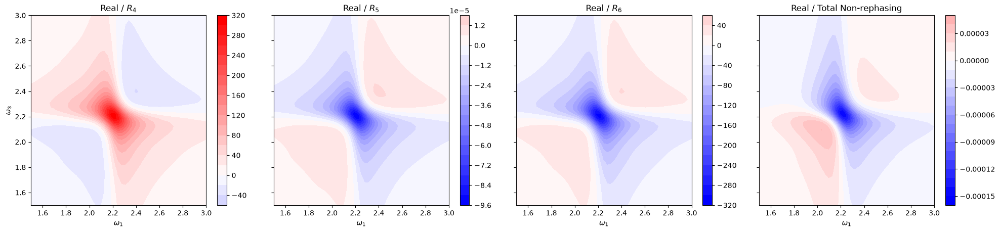

J coupling value = 0.15... T2 = 80.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


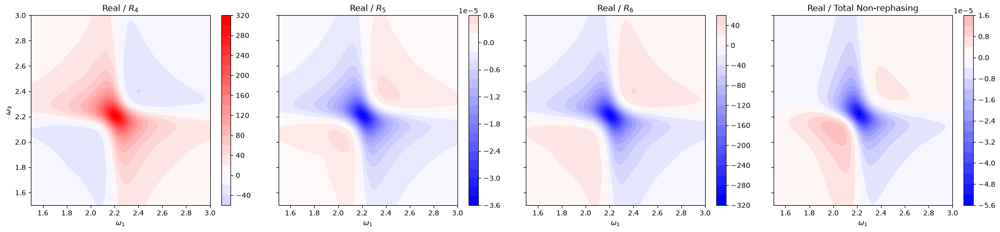

J coupling value = 0.15... T2 = 85.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


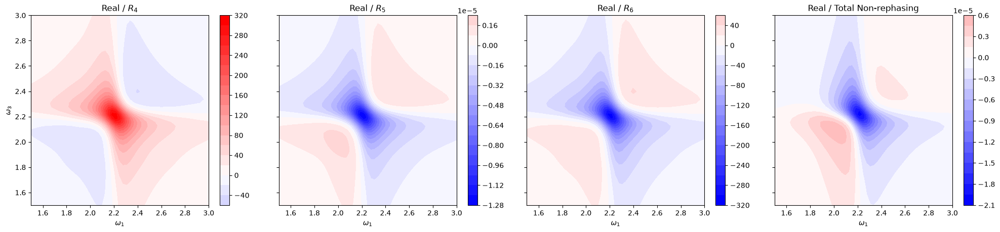

J coupling value = 0.15... T2 = 90.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


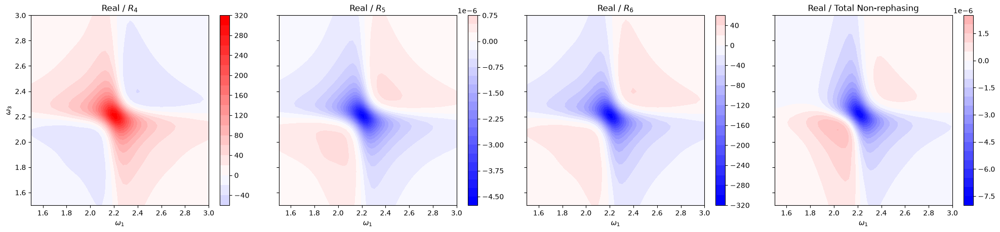

J coupling value = 0.15... T2 = 95.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


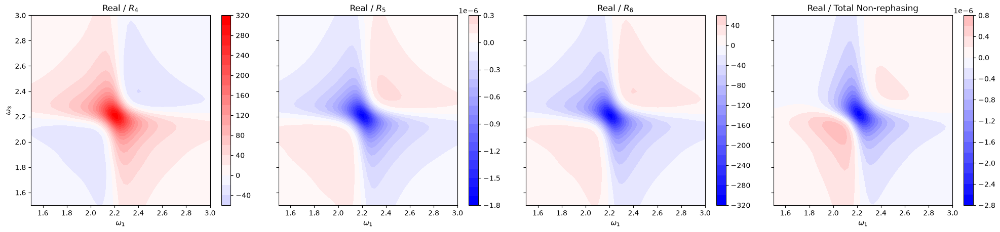

J coupling value = 0.15... T2 = 100.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


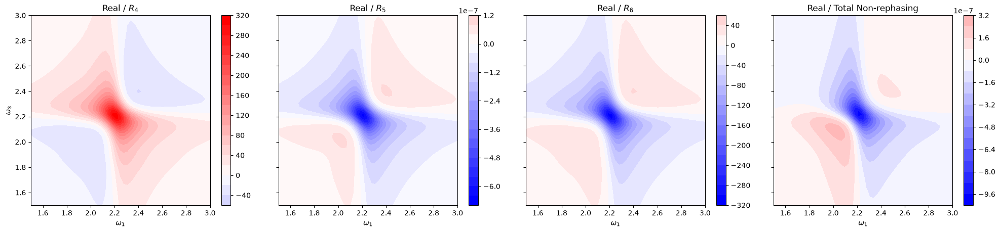

J coupling value = 0.15... T2 = 5.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


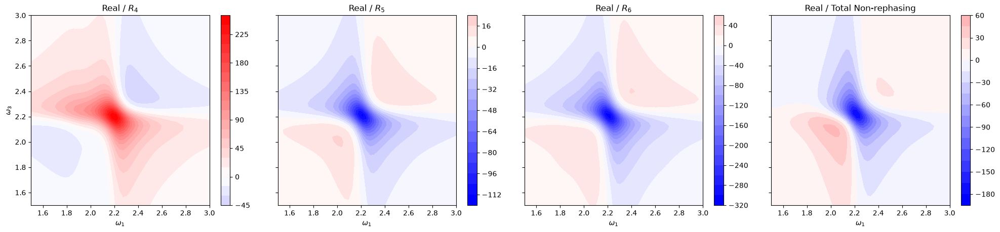

J coupling value = 0.15... T2 = 10.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


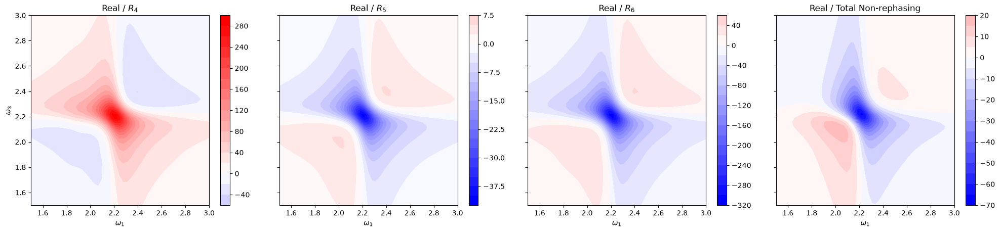

J coupling value = 0.15... T2 = 15.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


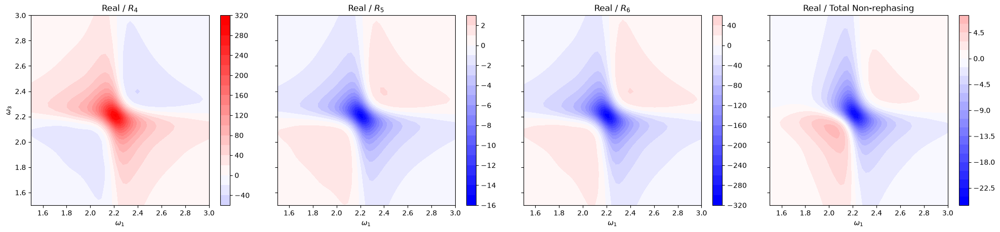

J coupling value = 0.15... T2 = 20.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


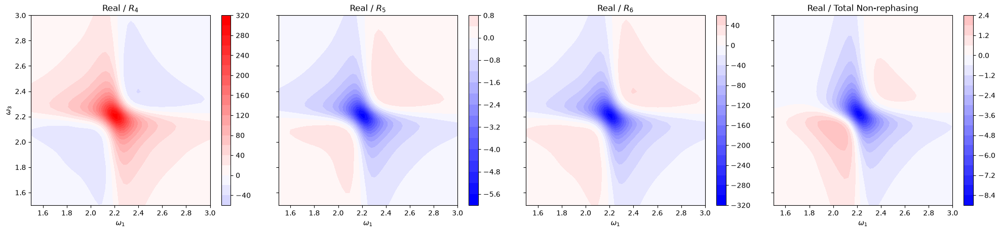

J coupling value = 0.15... T2 = 25.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


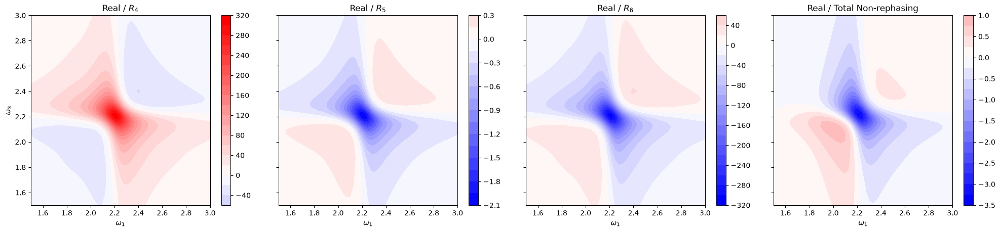

J coupling value = 0.15... T2 = 30.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


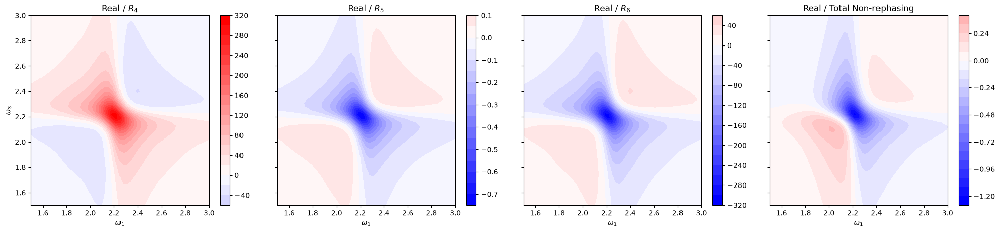

J coupling value = 0.15... T2 = 35.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


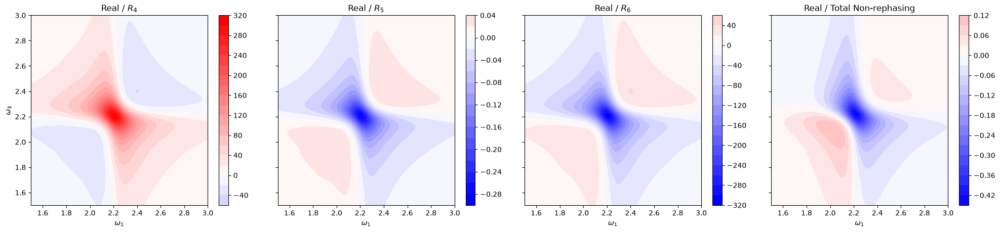

J coupling value = 0.15... T2 = 40.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


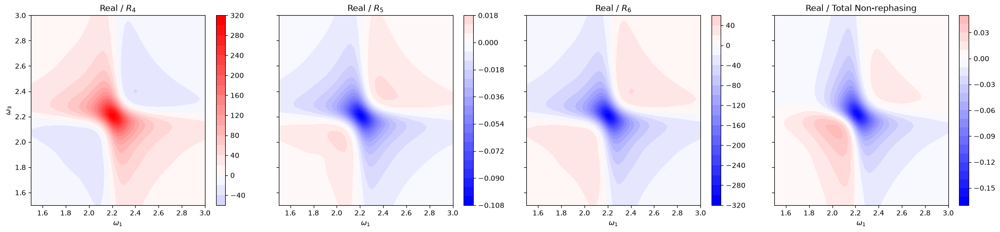

J coupling value = 0.15... T2 = 45.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


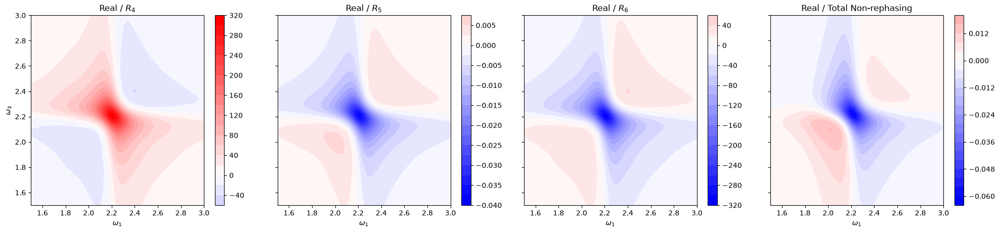

J coupling value = 0.15... T2 = 50.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


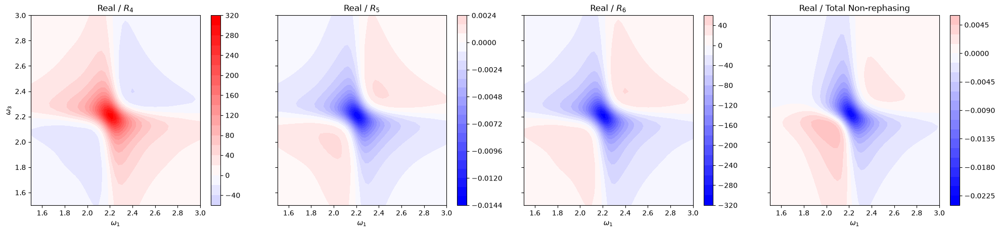

J coupling value = 0.15... T2 = 55.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


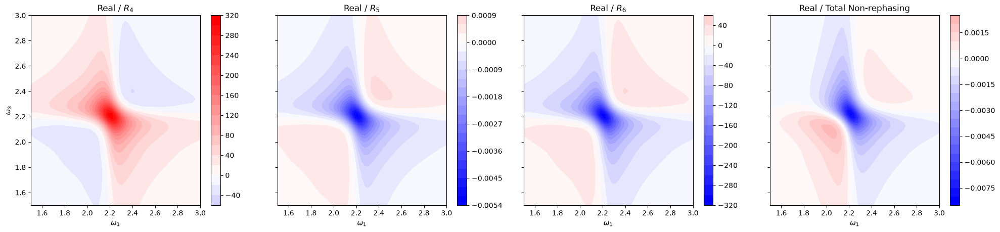

J coupling value = 0.15... T2 = 60.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


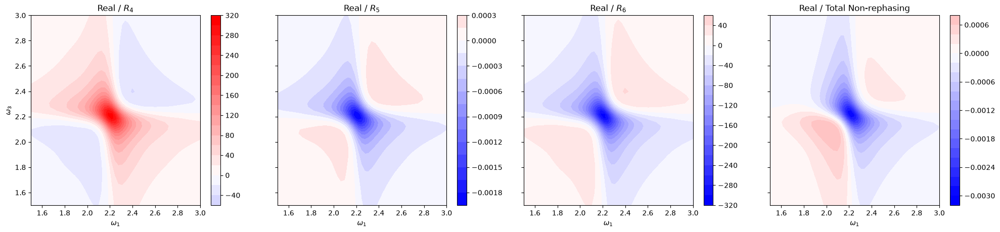

J coupling value = 0.15... T2 = 65.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


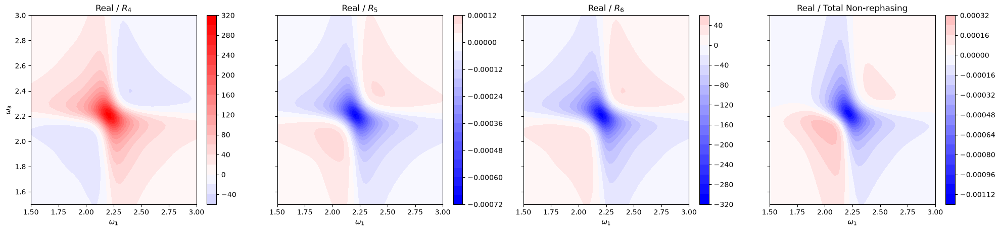

J coupling value = 0.15... T2 = 70.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


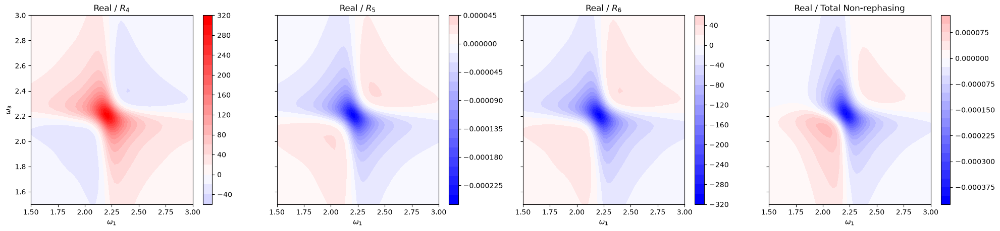

J coupling value = 0.15... T2 = 75.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


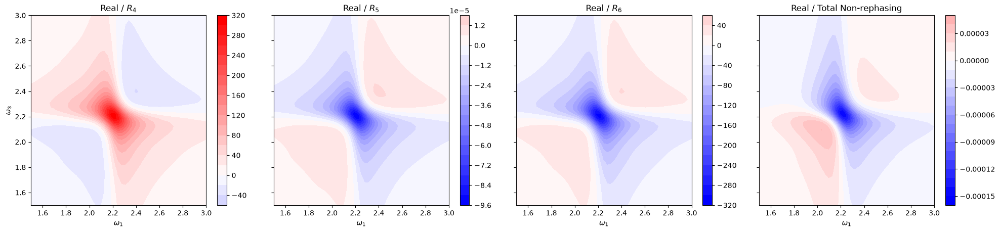

J coupling value = 0.15... T2 = 80.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


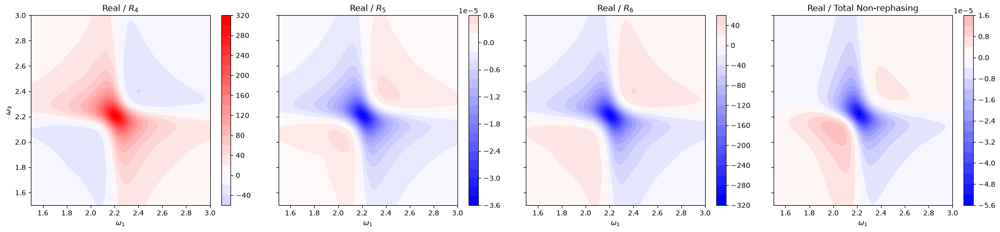

J coupling value = 0.15... T2 = 85.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


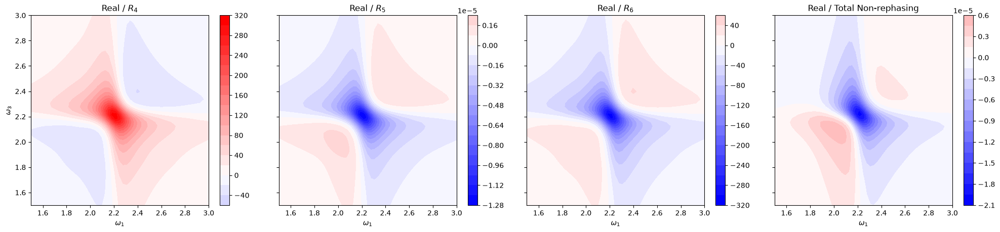

J coupling value = 0.15... T2 = 90.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


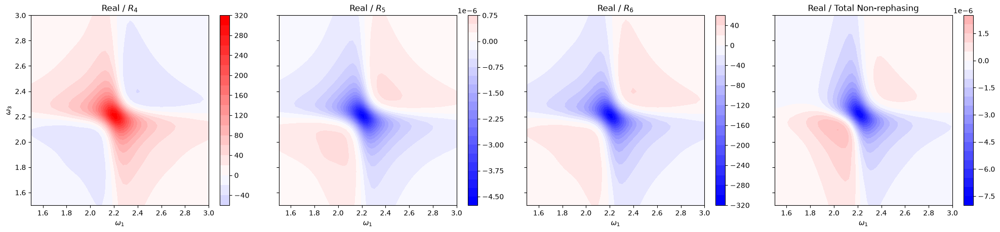

J coupling value = 0.15... T2 = 95.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


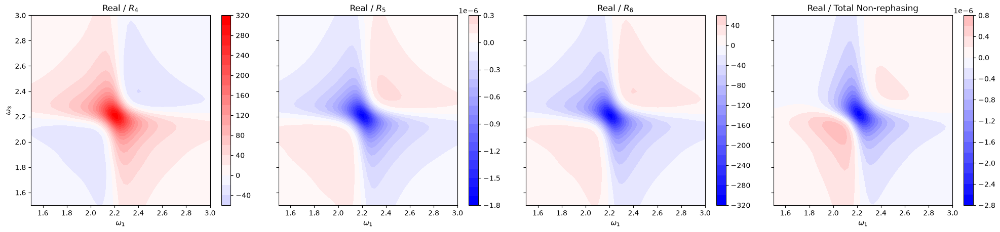

J coupling value = 0.15... T2 = 100.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


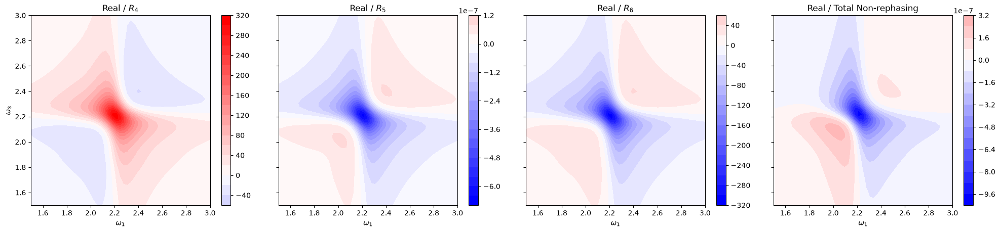

J coupling value = 0.15... T2 = 5.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


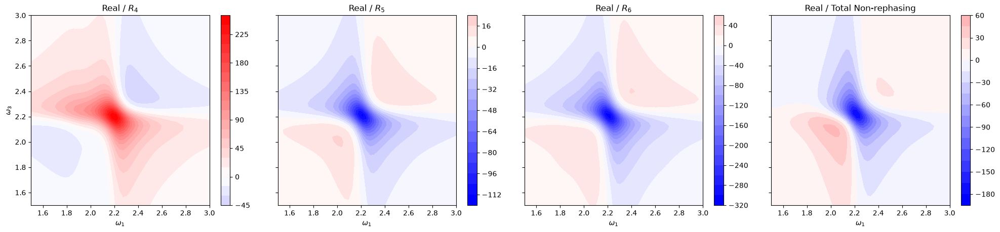

J coupling value = 0.15... T2 = 10.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


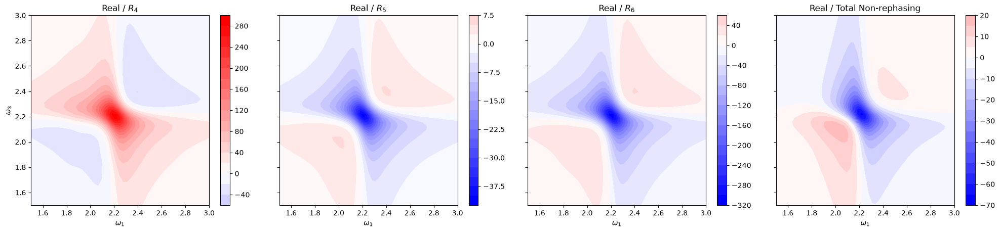

J coupling value = 0.15... T2 = 15.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


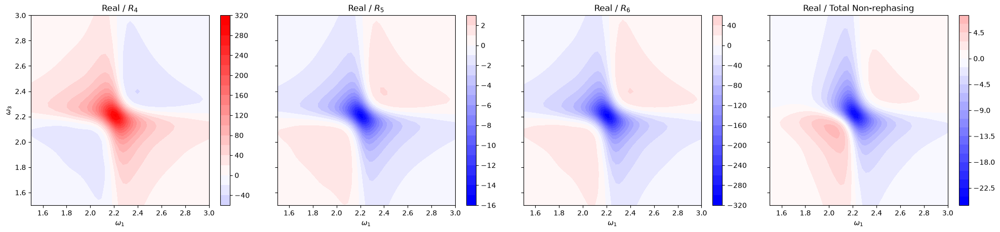

J coupling value = 0.15... T2 = 20.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


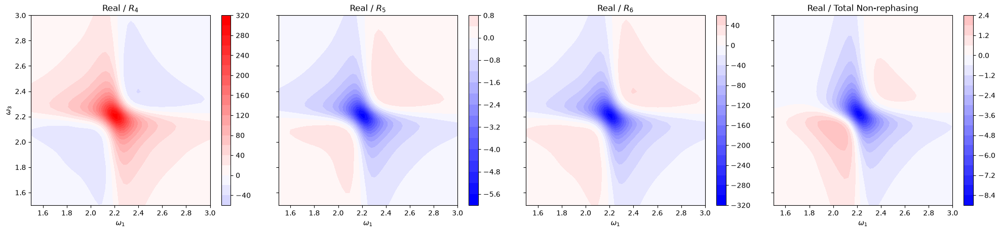

J coupling value = 0.15... T2 = 25.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


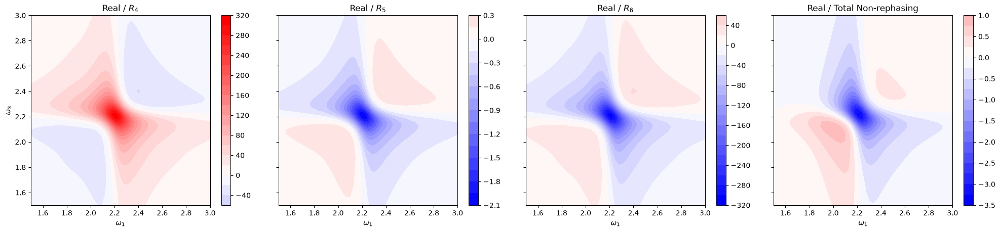

J coupling value = 0.15... T2 = 30.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


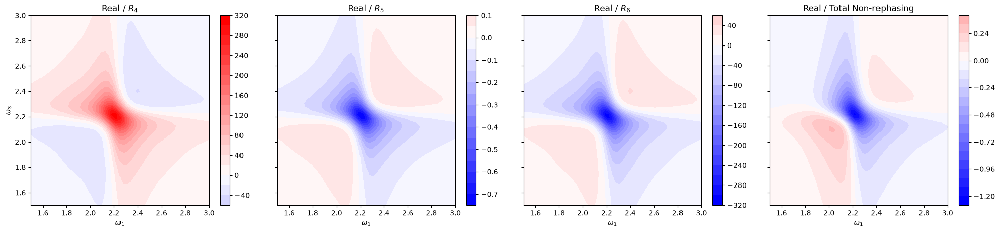

J coupling value = 0.15... T2 = 35.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


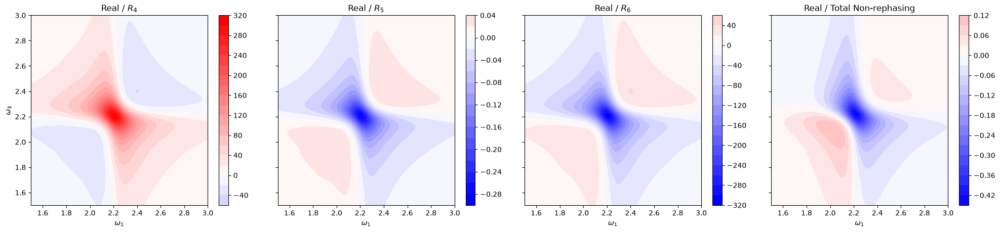

J coupling value = 0.15... T2 = 40.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


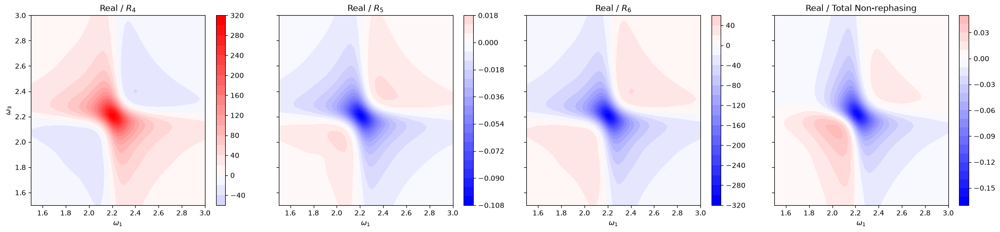

J coupling value = 0.15... T2 = 45.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


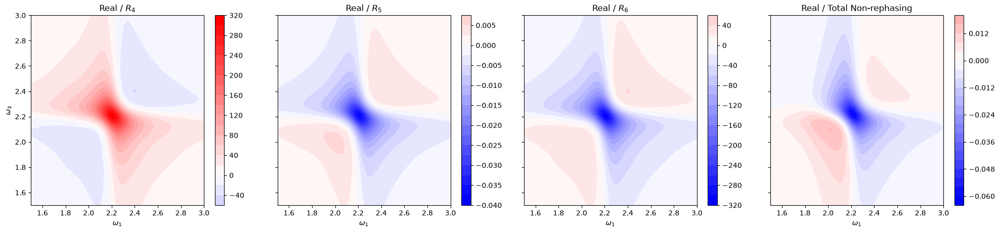

J coupling value = 0.15... T2 = 50.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


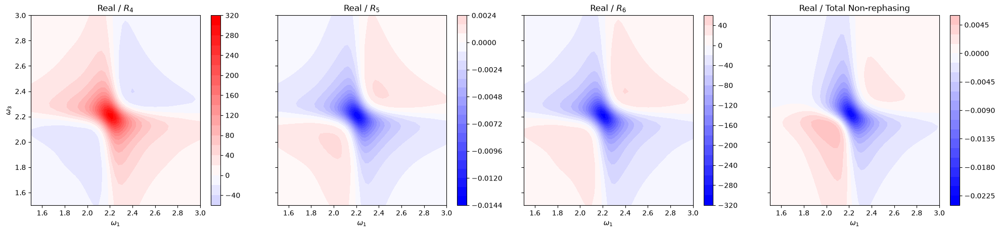

J coupling value = 0.15... T2 = 55.0...
--- Model loading (interaction type: dipole) ---
Model transformed to the eigenbasis.
Liouville backend ready: dense.
Starting 2D scan on a 200x200 frequency grid with Liouville=dense, components=both, parallel=threading, n_jobs=20.
Calculating 6 pathway spectrum/s on a 200x200 grid: R1, R2, R3, R4, R5, R6.


In [ ]:
j_values = [0.15]
t2_values = 10 * [5.0, 10.0, 15.0, 20.0, 25.0, 30.0, 35.0, 40.0, 45.0, 50.0, 55.0, 60.0, 65.0, 70.0, 75.0, 80.0, 85.0, 90.0, 95.0, 100.0]
kappa_value = [0.01, 0.05, 0.10, 0.15, 0.20]
w_list = np.linspace(-3, 3, 200)



for j in j_values:
    for t in t2_values:

        print(f"J coupling value = {j}... T2 = {t}...")
        params_model['j_coupling'] = j
       


        H, A_op, mu_op, c_ops_list = build_coupled_dimer_model(params_model)
        solver = LiouvilleSpectroscopySolver(solver_params)
        solver.feed_model(
            H_model=H,
            interaction_op_array=mu_op,
            c_ops_raw=c_ops_list,
            interaction_type="dipole",
        )


        spectra = solver.generate_2D_spectra(w_list, tau2=t)
        pathway_spectra = solver.generate_2D_pathways(w_list, tau2=t)
        plotter = SpectroscopyPlotter(w_list)
        plotter.plot_pathways_grid(
            pathways_dict=pathway_spectra, 
            signal_type="unrephasing",       # Cherchera R1, R2, R3 et zoomera sur (x, -y)
            total_signal=spectra['unrephasing'],
            component = 'real',
            zoom_bounds=(1.5, 3, 1.5, 3)
        )
        
